#"NOBODY KNOWS ANYTHING"

## Notebook for Movie Investment Decision Analysis

Created for NYU Stern Term Project in Data Science (Technical)

#Load Files

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:

#%cd gdrive/My Drive/NYU Data Science Project (Team Folder)/
%cd gdrive/My Drive/NYU DS Notebooks
#%cd gdrive/My Drive/Colab Notebooks/

/content/gdrive/My Drive/NYU DS Notebooks


In [ ]:
#import libraries needed

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import json
from ast import literal_eval

# just some stylistic tweaks in seaborn
sns.set(style='ticks', palette='Set2')

In [ ]:
#import files

credits = pd.read_csv('tmdb_5000_credits_kaggle.csv')
movies = pd.read_csv('tmdb_5000_movies_kaggle.csv')






#Data Pre Processing

In [ ]:
# step 1: need to merge files:

In [ ]:
credits.shape

(4803, 4)

In [ ]:
movies.shape

(4803, 20)

In [ ]:
credits.head()

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,49026,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,49529,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."


In [ ]:
#what does our data look like?

credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   movie_id  4803 non-null   int64 
 1   title     4803 non-null   object
 2   cast      4803 non-null   object
 3   crew      4803 non-null   object
dtypes: int64(1), object(3)
memory usage: 150.2+ KB


credits has 4 features for 4803 movies:

movie_id - TMDB movie id (int)
title -  title of the movie (string)
cast - json with cast info per movie id:
* cast_id  
* character  
* credit_id  
* gender  
* id  
* name  
* order
credit - json with production credit info for the movie:
* credit_id    
* department    
* gender  
* id  
* job  
* name

In [ ]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4803 entries, 0 to 4802
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   genres                4803 non-null   object 
 2   homepage              1712 non-null   object 
 3   id                    4803 non-null   int64  
 4   keywords              4803 non-null   object 
 5   original_language     4803 non-null   object 
 6   original_title        4803 non-null   object 
 7   overview              4800 non-null   object 
 8   popularity            4803 non-null   float64
 9   production_companies  4803 non-null   object 
 10  production_countries  4803 non-null   object 
 11  release_date          4802 non-null   object 
 12  revenue               4803 non-null   int64  
 13  runtime               4801 non-null   float64
 14  spoken_languages      4803 non-null   object 
 15  status               

Movies has the 20 features for 4803 movies:

- budget - movie budget                
- genres - json data having the following info for the specific movie genre  
    * id - genre id  
    * name - genre name for the specific movie  
- homepage - URL of the movie website               
- id - movie id                     
- keywords - json with the following info for the specific movie keywords                
    * id - keyword id  
    * name - keyword name for the specific movie      
- original_language - language in which original movie was released      
- original_title - original title of the movie         
- overview - movie description              
- popularity - popularity rating of the movie on TMDB           
- production_companies - json data for the production companies involved in the movie  
    * id - production company id  
    * name - production company name for the specific movie          
- production_countries  - additional json data on the the production companies of the movie  
    * iso_3166_1 -  ISO Code for the country of primary production   
    * name - Country name where the movie was made  
- release_date - release date           
- revenue - movie revenue                 
- runtime                 
- spoken_languages        
    * iso_639_1 - Code for the language     
    * name - language name  
- status - Movie Status - Released, Rumored, Post production                
- tagline - Movie Tagline                
- title - movie title                  
- vote_average - average vote on TMDB         
- vote_count - vote count on TMDB

#Data Processing Steps:


In [ ]:
#merge files into one


df_merged = pd.merge(
    left=movies,right=credits, left_on='id', right_on='movie_id',
     suffixes=('_left', '_right'))

In [ ]:
#drop duplicated columns 

df_merged = df_merged.drop(["movie_id","title_right"], axis="columns")
df_merged.rename(columns= {'title_left':'title'}, inplace = True)

#drop columns that will be irrelevant to the problem (or not known pre-production)
df_merged = df_merged.drop(["homepage","overview", "popularity", "tagline","vote_average", "vote_count","original_title", "original_language", "status"], axis="columns")
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4803 entries, 0 to 4802
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   budget                4803 non-null   int64  
 1   genres                4803 non-null   object 
 2   id                    4803 non-null   int64  
 3   keywords              4803 non-null   object 
 4   production_companies  4803 non-null   object 
 5   production_countries  4803 non-null   object 
 6   release_date          4802 non-null   object 
 7   revenue               4803 non-null   int64  
 8   runtime               4801 non-null   float64
 9   spoken_languages      4803 non-null   object 
 10  title                 4803 non-null   object 
 11  cast                  4803 non-null   object 
 12  crew                  4803 non-null   object 
dtypes: float64(1), int64(3), object(9)
memory usage: 525.3+ KB


In [ ]:
# check for missing values

df_merged.isna().sum()

budget                  0
genres                  0
id                      0
keywords                0
production_companies    0
production_countries    0
release_date            1
revenue                 0
runtime                 2
spoken_languages        0
title                   0
cast                    0
crew                    0
dtype: int64

Extracting Data from JSONs

In [ ]:
# extract data encoded in jsons

df_merged['crew'] = df_merged['crew'].apply(json.loads, encoding="utf-8") 
df_merged['cast'] = df_merged['cast'].apply(json.loads, encoding="utf-8") 


In [ ]:
# Get the director's name from the crew feature. If director is not listed, return NaN

# with help from here https://www.kaggle.com/ibtesama/getting-started-with-a-movie-recommendation-system

def get_director(x):
    for i in x:
        if i['job'] == 'Director':
            return i['name']
    return np.nan

df_merged['director'] = df_merged['crew'].apply(get_director)

In [ ]:
def get_producer(x):
    for i in x:
        if i['job'] == 'Producer':
            return i['name']
    return np.nan

df_merged['producer'] = df_merged['crew'].apply(get_producer)

In [ ]:
def get_exec(x):
    for i in x:
        if i['job'] == 'Executive Producer':
            return i['name']
    return np.nan

df_merged['exec_producer'] = df_merged['crew'].apply(get_exec)

In [ ]:
def get_writer(x):
    for i in x:
        if i['job'] == 'Writer':
            return i['name']
    return np.nan

df_merged['writer'] = df_merged['crew'].apply(get_writer)

In [ ]:
def get_screenwriter(x):
    for i in x:
        if i['job'] == 'Screenplay':
            return i['name']
    return np.nan

df_merged['screenwriter'] = df_merged['crew'].apply(get_screenwriter)

In [ ]:
def get_actor1(x):
    for i in x:
        if i['order'] == 1:
            return i['name']
    return np.nan

df_merged['actor1'] = df_merged['cast'].apply(get_actor1)

In [ ]:
def get_actor2(x):
    for i in x:
        if i['order'] == 2:
            return i['name']
    return np.nan

df_merged['actor2'] = df_merged['cast'].apply(get_actor2)

def get_actor3(x):
    for i in x:
        if i['order'] == 3:
            return i['name']
    return np.nan

df_merged['actor3'] = df_merged['cast'].apply(get_actor3)

def get_actor4(x):
    for i in x:
        if i['order'] == 4:
            return i['name']
    return np.nan

df_merged['actor4'] = df_merged['cast'].apply(get_actor4)

def get_actor5(x):
    for i in x:
        if i['order'] == 5:
            return i['name']
    return np.nan

df_merged['actor5'] = df_merged['cast'].apply(get_actor5)

In [ ]:
df_merged['production_companies'] = df_merged['production_companies'].apply(json.loads, encoding="utf-8") 

def get_studio1(x):
    for i in x:
        #if i == 1:
        return i['name']
    return np.nan

df_merged['studio1'] = df_merged['production_companies'].apply(get_studio1)



In [ ]:
# extracts primary production country from JSON (thinking is that location of production may impact costs, and therefore profitability)

df_merged['production_countries'] = df_merged['production_countries'].apply(json.loads, encoding="utf-8") 

def get_country(x):
    for i in x:
        #if i == 1:
        return i['name']
    return np.nan

df_merged['prod_country1'] = df_merged['production_countries'].apply(get_country)

In [ ]:
# pull out key crew crew members

#help from here: https://www.kaggle.com/sanjames/json-parsing-linear-regression-analysis

def process_jsoncols(colname):
    jsoncollist=[]
    for x in colname:
        jsoncollist.append(x['name'])
    return jsoncollist

key_jobs = []
key_jobs = ['Director','Writer','Producer','Executive Producer','Screenplay']

for index,x in zip(df_merged.index,df_merged['crew']):
    crewlist=[]
    for i in range(len(x)):
        if (x[i]['job'] in key_jobs):
            crewlist.append((x[i]['name']))
    df_merged.loc[index,'key_crew']=str(crewlist)

df_merged['key_crew'] = df_merged['key_crew'].apply(literal_eval) 

In [ ]:
df_merged['key_crew'].head(10)

0    [James Cameron, James Cameron, James Cameron, ...
1    [Gore Verbinski, Jerry Bruckheimer, Ted Elliot...
2    [Sam Mendes, John Logan, Barbara Broccoli, Rob...
3    [Charles Roven, Christopher Nolan, Christopher...
4    [Andrew Stanton, Andrew Stanton, Colin Wilson,...
5    [Joseph M. Caracciolo Jr., Sam Raimi, Sam Raim...
6    [John Lasseter, Dan Fogelman, Roy Conli, Byron...
7    [Stan Lee, Kevin Feige, Patricia Whitcher, Jos...
8    [Steve Kloves, David Heyman, David Yates, Davi...
9    [Charles Roven, Christopher Nolan, Emma Thomas...
Name: key_crew, dtype: object

In [ ]:
df_merged['key_crew'].isnull().sum()

0

In [ ]:
#pull out top 5 cast members

for index,x in zip(df_merged.index,df_merged['cast']):
    castlist=[]
    for i in range(len(x)):
        if (x[i]['order'] < 6):
            castlist.append((x[i]['name']))
    df_merged.loc[index,'key_cast']=str(castlist)   

df_merged['key_cast'] = df_merged['key_cast'].apply(literal_eval)   
 

In [ ]:
#basic DQ check
df_merged['key_cast'].head(10)

0    [Sam Worthington, Zoe Saldana, Sigourney Weave...
1    [Johnny Depp, Orlando Bloom, Keira Knightley, ...
2    [Daniel Craig, Christoph Waltz, Léa Seydoux, R...
3    [Christian Bale, Michael Caine, Gary Oldman, A...
4    [Taylor Kitsch, Lynn Collins, Samantha Morton,...
5    [Tobey Maguire, Kirsten Dunst, James Franco, T...
6    [Zachary Levi, Mandy Moore, Donna Murphy, Ron ...
7    [Robert Downey Jr., Chris Hemsworth, Mark Ruff...
8    [Daniel Radcliffe, Rupert Grint, Emma Watson, ...
9    [Ben Affleck, Henry Cavill, Gal Gadot, Amy Ada...
Name: key_cast, dtype: object

In [ ]:
#basic DQ check
df_merged['cast'].isnull().sum()

0

In [ ]:
#production companies - removed temp. b/c of new prod company section above

#df_merged['production_companies'] = df_merged['production_companies'].apply(json.loads, encoding="utf-8")

In [ ]:
df_merged['production_companies'] = df_merged['production_companies'].apply(process_jsoncols)

In [ ]:
df_merged['production_companies'].head(10)

0    [Ingenious Film Partners, Twentieth Century Fo...
1    [Walt Disney Pictures, Jerry Bruckheimer Films...
2                     [Columbia Pictures, Danjaq, B24]
3    [Legendary Pictures, Warner Bros., DC Entertai...
4                               [Walt Disney Pictures]
5    [Columbia Pictures, Laura Ziskin Productions, ...
6    [Walt Disney Pictures, Walt Disney Animation S...
7    [Marvel Studios, Prime Focus, Revolution Sun S...
8                         [Warner Bros., Heyday Films]
9    [DC Comics, Atlas Entertainment, Warner Bros.,...
Name: production_companies, dtype: object

In [ ]:
#basic DQ check
df_merged['production_companies'].isnull().sum()

0

In [ ]:
from ast import literal_eval

df_merged['keywords'] = df_merged['keywords'].apply(literal_eval)

In [ ]:
#help from here: https://www.kaggle.com/ibtesama/getting-started-with-a-movie-recommendation-system

# Returns the list top 3 elements or entire list; whichever is more.
def get_list(x):
    if isinstance(x, list):
        names = [i['name'] for i in x]
        #cap # keywords at 5
        if len(names) > 5:
            names = names[:5]
        return names

    #Return empty list in case of missing/malformed data
    return []

In [ ]:
 df_merged['keywords'] = df_merged['keywords'].apply(get_list)

In [ ]:
df_merged['keywords'].head(10)

0    [culture clash, future, space war, space colon...
1    [ocean, drug abuse, exotic island, east india ...
2     [spy, based on novel, secret agent, sequel, mi6]
3    [dc comics, crime fighter, terrorist, secret i...
4    [based on novel, mars, medallion, space travel...
5    [dual identity, amnesia, sandstorm, love of on...
6         [hostage, magic, horse, fairy tale, musical]
7    [marvel comic, sequel, superhero, based on com...
8    [witch, magic, broom, school of witchcraft, wi...
9    [dc comics, vigilante, superhero, based on com...
Name: keywords, dtype: object

In [ ]:
#basic DQ check
df_merged['keywords'].isnull().sum()

0

In [ ]:
df_merged['genres'] = df_merged['genres'].apply(literal_eval)
df_merged['genres'] = df_merged['genres'].apply(get_list)

In [ ]:
#with help from here: https://www.kaggle.com/c/tmdb-box-office-prediction/discussion/80045 and https://stackoverflow.com/questions/1894269/how-to-convert-string-representation-of-list-to-a-list


json_cols = [
#    'production_countries',
    'spoken_languages'
]

for column in json_cols:
  df_merged[column] = df_merged[column].apply(literal_eval)
  df_merged[column] = df_merged[column].apply(get_list)

In [ ]:
# creating unique columns for lists of categoricals



# with help from: https://stackoverflow.com/questions/35491274/pandas-split-column-of-lists-into-multiple-columns

# genres

df_list_extract = pd.DataFrame([pd.Series(x) for x in df_merged.genres])
df_list_extract.columns = ['genre_{}'.format(x+1) for x in df_list_extract.columns]
df_merged = pd.concat([df_merged, df_list_extract], axis=1, sort=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':


In [ ]:
# keywords

df_list_extract = pd.DataFrame([pd.Series(x) for x in df_merged.keywords])
df_list_extract.columns = ['keyword_{}'.format(x+1) for x in df_list_extract.columns]
df_merged = pd.concat([df_merged, df_list_extract], axis=1, sort=False)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
# spoken langauges

df_list_extract = pd.DataFrame([pd.Series(x) for x in df_merged.spoken_languages])
df_list_extract.columns = ['lang_{}'.format(x+1) for x in df_list_extract.columns]
df_merged = pd.concat([df_merged, df_list_extract], axis=1, sort=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


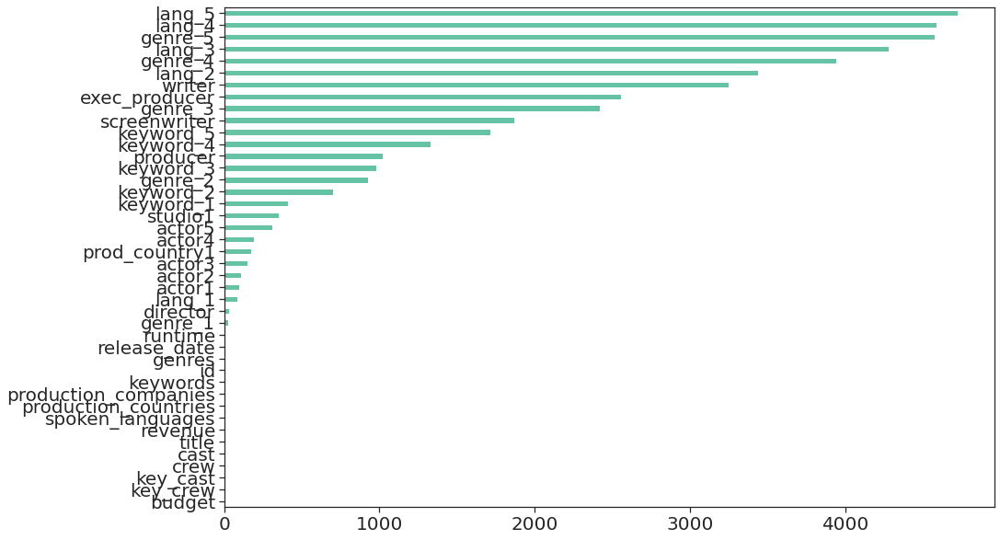

In [ ]:
#Counting NA in new dataset

fig = plt.figure(figsize=(15, 10))
df_merged.isna().sum().sort_values(ascending=True).plot(kind='barh', fontsize=20)

In [ ]:
# turn columns into categoricals

for col in ["keyword_1","keyword_2","keyword_3","keyword_4","keyword_5","genre_1","genre_2","genre_3",
            "genre_4","genre_5","director","actor1","actor2","actor3","actor4","actor5","studio1","producer",
            "writer","screenwriter","exec_producer"]:
    df_merged[col] = df_merged[col].astype('category')
    #df_merged = df_merged.replace({np.nan: None})

In [ ]:
# create csv file with pre-processed data (but before feature engineering)

#df_merged.to_csv(r'data_pre_processed.csv')

#Feature Engineering



In [ ]:
# create year and month of release

from datetime import datetime
df_merged['release_date'] = pd.to_datetime(df_merged['release_date'])
df_merged['release_year'] = df_merged['release_date'].dt.year
df_merged['release_month'] = df_merged['release_date'].dt.month
df_merged[['release_year','release_month']].head(2)

,release_year,release_month
0,2009.0,12.0
1,2007.0,5.0


In [ ]:
# create age in years column

now = datetime.now()
df_merged['age'] = (now - df_merged['release_date']).astype('timedelta64[Y]')

df_merged[['age','release_year']].head(3)

,age,release_year
0,11.0,2009.0
1,13.0,2007.0
2,5.0,2015.0


### Create Basic Financial Columns + Classifiers

In [ ]:
# create profit column

df_merged['profit'] = (df_merged['revenue'] - df_merged['budget'])

#create return on investment column (denominator adjusted to avoid infinite RoIs)

df_merged['roi'] = round(((df_merged['revenue'] - df_merged['budget']) / (df_merged['budget']+1)),2)
#df_merged= df_merged.drop("roi_percent", axis="columns")

In [ ]:
# Inflation Adjustments 

inflation = 0.02
df_merged['revenue_adj'] = df_merged['revenue'] * (1 + inflation)**(2020-df_merged['release_year']) 
df_merged['budget_adj'] = df_merged['budget'] * (1 + inflation)**(2020-df_merged['release_year']) 
df_merged['profit_adj'] = df_merged['profit'] * (1 + inflation)**(2020-df_merged['release_year']) 


df_merged.drop(['revenue','budget','profit'], axis='columns', inplace=True)


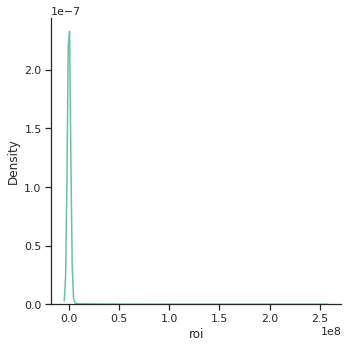

In [ ]:
# look at distribution of ROI and Profit to set threshold for classifications (i.e. hih profit, low profit, loss etc.)

sns.displot(df_merged, x='roi', kind="kde")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9854752390>]],
      dtype=object)

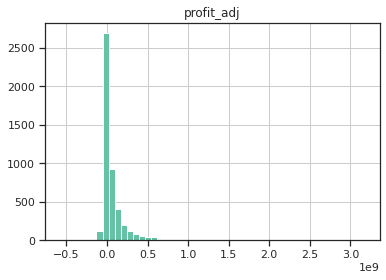

In [ ]:
df_merged.hist("profit_adj", bins = 50)

In [ ]:
# something is wrong with ROI - the right tail is too large.  what is it?

df_merged.head(20)[['title','profit_adj','roi']]
#df_merged.nlargest(5, ['roi']) 

,title,profit_adj,roi
0,Avatar,3.171804e+09,10.76
1,Pirates of the Caribbean: At World's End,8.550740e+08,2.20
2,Spectre,7.018361e+08,2.59
3,The Dark Knight Rises,9.782642e+08,3.34
4,John Carter,2.828280e+07,0.09
5,Spider-Man 3,8.186869e+08,2.45
6,Tangled,4.044562e+08,1.28
7,Avengers: Age of Ultron,1.242537e+09,4.02
8,Harry Potter and the Half-Blood Prince,8.504173e+08,2.74
9,Batman v Superman: Dawn of Justice,6.746369e+08,2.49


In [ ]:
df_merged.nlargest(5, ['roi']) 

,genres,id,keywords,production_companies,production_countries,release_date,runtime,spoken_languages,title,cast,crew,director,producer,exec_producer,writer,screenwriter,actor1,actor2,actor3,actor4,actor5,studio1,prod_country1,key_crew,key_cast,genre_1,genre_2,genre_3,genre_4,genre_5,keyword_1,keyword_2,keyword_3,keyword_4,keyword_5,lang_1,lang_2,lang_3,lang_4,lang_5,release_year,release_month,age,roi,revenue_adj,budget_adj,profit_adj
691,"[Action, Adventure, Comedy]",11199,"[midlife crisis, road trip, politically incorr...","[Wild Hogs Productions, Touchstone Pictures]","[{'iso_3166_1': 'US', 'name': 'United States o...",2007-03-02,100.0,[English],Wild Hogs,"[{'cast_id': 1, 'character': 'Doug Madsen', 'c...","[{'credit_id': '52fe440e9251416c750276bb', 'de...",Walt Becker,Brian Robbins,Amy Sayres,NaN,Brad Copeland,John Travolta,Martin Lawrence,William H. Macy,Ray Liotta,Marisa Tomei,Wild Hogs Productions,United States of America,"[Amy Sayres, Brian Robbins, Mike Tollin, Sharl...","[Tim Allen, John Travolta, Martin Lawrence, Wi...",Action,Adventure,Comedy,NaN,NaN,midlife crisis,road trip,politically incorrect,motorcycle gang,biker film,English,NaN,NaN,NaN,NaN,2007.0,3.0,13.0,253625427.0,3.280915e+08,0.0,3.280915e+08
2669,"[Adventure, Comedy]",9396,"[new york, crocodile, australia, large knife, ...",[Paramount Pictures],"[{'iso_3166_1': 'AU', 'name': 'Australia'}, {'...",1988-05-19,110.0,[English],Crocodile Dundee II,"[{'cast_id': 1, 'character': 'Michael J. 'Croc...","[{'credit_id': '52fe44f2c3a36847f80b36c7', 'de...",John Cornell,John Cornell,Paul Hogan,NaN,NaN,Linda Kozlowski,John Meillon,Ernie Dingo,Charles S. Dutton,Luis Guzmán,Paramount Pictures,Australia,"[Paul Hogan, John Cornell, John Cornell, Jane ...","[Paul Hogan, Linda Kozlowski, John Meillon, Er...",Adventure,Comedy,NaN,NaN,NaN,new york,crocodile,australia,large knife,aftercreditsstinger,English,NaN,NaN,NaN,NaN,1988.0,5.0,32.0,239606210.0,4.515476e+08,0.0,4.515476e+08
359,"[Adventure, Animation, Comedy, Family]",258509,"[chipmunk, cgi, talking animal, aftercreditsst...","[Regency Enterprises, Fox 2000 Pictures, Sunsw...","[{'iso_3166_1': 'US', 'name': 'United States o...",2015-12-17,92.0,[English],Alvin and the Chipmunks: The Road Chip,"[{'cast_id': 16, 'character': 'Dave', 'credit_...","[{'credit_id': '565c2c3f9251416919007486', 'de...",Walt Becker,"Ross Bagdasarian, Jr.",NaN,NaN,Randi Mayem Singer,NaN,Jason Lee,NaN,Justin Long,NaN,Regency Enterprises,United States of America,"[Randi Mayem Singer, Ross Bagdasarian, Jr., Ja...","[Jason Lee, Justin Long]",Adventure,Animation,Comedy,Family,NaN,chipmunk,cgi,talking animal,aftercreditsstinger,duringcreditsstinger,English,NaN,NaN,NaN,NaN,2015.0,12.0,4.0,233755553.0,2.580850e+08,0.0,2.580850e+08
1821,"[Mystery, Fantasy, Adventure, Comedy]",11024,"[detective, monster, engine, based on tv serie...","[Mosaic Media Group, Warner Bros.]","[{'iso_3166_1': 'US', 'name': 'United States o...",2004-03-24,93.0,[English],Scooby-Doo 2: Monsters Unleashed,"[{'cast_id': 1, 'character': 'Fred', 'credit_i...","[{'credit_id': '52fe43e69251416c75022553', 'de...",Raja Gosnell,Charles Roven,Joseph Barbera,NaN,James Gunn,Sarah Michelle Gellar,Matthew Lillard,Linda Cardellini,Seth Green,Peter Boyle,Mosaic Media Group,United States of America,"[Charles Roven, Raja Gosnell, Joseph Barbera, ...","[Freddie Prinze Jr., Sarah Michelle Gellar, Ma...",Mystery,Fantasy,Adventure,Comedy,NaN,detective,monster,engine,based on tv series,dog,English,NaN,NaN,NaN,NaN,2004.0,3.0,16.0,181466833.0,2.491151e+08,0.0,2.491151e+08
766,"[Animation, Comedy, Family]",9513,"[london england, cat, mistake in person, luxur...","[Twentieth Century Fox Film Corporation, Dune ...","[{'iso_3166_1': 'GB', 'name': 'United Kingdom'...",2006-06-15,78.0,"[English, Português]",Garfield: A Tail of Two Kitties,"[{'cast_id': 19, 'character': 'Garfield (voice...","[{'credit_id': '52fe4502c3a36847f80b709d', 'de...",Tim Hill,John Davis,Michele Imperato,NaN,Joel Cohen,Jennifer Love Hewitt,Bil

In [ ]:
# answer: many rows have budget = zero, which makes Roi v large.  Solution: impute budgets for these rows
zero_budget = df_merged.apply(lambda x : True
            if x['budget_adj'] == 0 else False, axis = 1) 
  
# Count number of True in the series 
num_rows = len(zero_budget[zero_budget == True].index) 
  
print('Number of Rows in dataframe with budget = zero : ', 
      num_rows ) 

Number of Rows in dataframe with budget = zero :  1036


In [ ]:
zero_budget_df = df_merged[['runtime','age','revenue_adj','budget_adj']].copy()

In [ ]:
zero_budget_df.describe()

,runtime,age,revenue_adj,budget_adj
count,4801.000000,4802.000000,4.802000e+03,4.802000e+03
mean,106.875859,17.474802,1.140212e+08,3.935784e+07
std,22.611935,12.399208,2.188420e+08,5.267357e+07
min,0.000000,3.000000,0.000000e+00,0.000000e+00
25%,94.000000,9.000000,0.000000e+00,1.148686e+06
50%,103.000000,15.000000,2.871676e+07,1.991821e+07
75%,118.000000,21.000000,1.269827e+08,5.491143e+07
max,338.000000,104.000000,3.466484e+09,5.841451e+08


In [ ]:
#clean up data in new df so imputer can run

#basic DQ check
zero_budget_df['budget_adj'].isnull().sum()

#replace NaNs

cols = ['runtime','age','revenue_adj','budget_adj']

for col in cols:
  zero_budget_df[col] = zero_budget_df[col].fillna(0)

In [ ]:
# try to impute budget from age, revenue and runtime (and zeroes in the other columns also)

# with help from: https://andymdc31.github.io/missing_data_and_using_sklearns_iterativeimputer

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer(max_iter=10, verbose=0, missing_values=0)
imp.fit(zero_budget_df)
imputed_df = imp.transform(zero_budget_df)
imputed_df = pd.DataFrame(imputed_df, columns=zero_budget_df.columns)

In [ ]:
imputed_df.describe()

,runtime,age,revenue_adj,budget_adj
count,4803.000000,4803.000000,4.803000e+03,4.803000e+03
mean,107.638678,17.474802,1.498253e+08,4.950575e+07
std,20.672018,12.397917,2.093118e+08,4.858041e+07
min,14.000000,3.000000,8.703620e+00,1.104081e+00
25%,94.000000,9.000000,2.994328e+07,1.696963e+07
50%,104.000000,15.000000,1.031875e+08,4.284739e+07
75%,117.500000,21.000000,1.498253e+08,5.519147e+07
max,338.000000,104.000000,3.466484e+09,5.841451e+08


In [ ]:
zero_budget_new = imputed_df.apply(lambda x : True
            if x['budget_adj'] == 0 else False, axis = 1) 
  
# Count number of True in the series 
num_rows2 = len(zero_budget_new[zero_budget_new == True].index) 
  
print('Number of Rows in dataframe with budget = zero : ', 
      num_rows2 ) 

Number of Rows in dataframe with budget = zero :  0


In [ ]:
imputed_df.rename(columns= {'runtime':'runtime_imp'}, inplace = True)
imputed_df.rename(columns= {'age':'age_imp'}, inplace = True)
imputed_df.rename(columns= {'revenue_adj':'revenue_adj_imp'}, inplace = True)
imputed_df.rename(columns= {'budget_adj':'budget_adj_imp'}, inplace = True)

In [ ]:
df_new = pd.concat([df_merged, imputed_df], axis=1, sort=False)

In [ ]:
df_new.nlargest(5, ['roi']) 

,genres,id,keywords,production_companies,production_countries,release_date,runtime,spoken_languages,title,cast,crew,director,producer,exec_producer,writer,screenwriter,actor1,actor2,actor3,actor4,actor5,studio1,prod_country1,key_crew,key_cast,genre_1,genre_2,genre_3,genre_4,genre_5,keyword_1,keyword_2,keyword_3,keyword_4,keyword_5,lang_1,lang_2,lang_3,lang_4,lang_5,release_year,release_month,age,roi,revenue_adj,budget_adj,profit_adj,runtime_imp,age_imp,revenue_adj_imp,budget_adj_imp
691,"[Action, Adventure, Comedy]",11199,"[midlife crisis, road trip, politically incorr...","[Wild Hogs Productions, Touchstone Pictures]","[{'iso_3166_1': 'US', 'name': 'United States o...",2007-03-02,100.0,[English],Wild Hogs,"[{'cast_id': 1, 'character': 'Doug Madsen', 'c...","[{'credit_id': '52fe440e9251416c750276bb', 'de...",Walt Becker,Brian Robbins,Amy Sayres,NaN,Brad Copeland,John Travolta,Martin Lawrence,William H. Macy,Ray Liotta,Marisa Tomei,Wild Hogs Productions,United States of America,"[Amy Sayres, Brian Robbins, Mike Tollin, Sharl...","[Tim Allen, John Travolta, Martin Lawrence, Wi...",Action,Adventure,Comedy,NaN,NaN,midlife crisis,road trip,politically incorrect,motorcycle gang,biker film,English,NaN,NaN,NaN,NaN,2007.0,3.0,13.0,253625427.0,3.280915e+08,0.0,3.280915e+08,100.0,13.0,3.280915e+08,7.630103e+07
2669,"[Adventure, Comedy]",9396,"[new york, crocodile, australia, large knife, ...",[Paramount Pictures],"[{'iso_3166_1': 'AU', 'name': 'Australia'}, {'...",1988-05-19,110.0,[English],Crocodile Dundee II,"[{'cast_id': 1, 'character': 'Michael J. 'Croc...","[{'credit_id': '52fe44f2c3a36847f80b36c7', 'de...",John Cornell,John Cornell,Paul Hogan,NaN,NaN,Linda Kozlowski,John Meillon,Ernie Dingo,Charles S. Dutton,Luis Guzmán,Paramount Pictures,Australia,"[Paul Hogan, John Cornell, John Cornell, Jane ...","[Paul Hogan, Linda Kozlowski, John Meillon, Er...",Adventure,Comedy,NaN,NaN,NaN,new york,crocodile,australia,large knife,aftercreditsstinger,English,NaN,NaN,NaN,NaN,1988.0,5.0,32.0,239606210.0,4.515476e+08,0.0,4.515476e+08,110.0,32.0,4.515476e+08,9.485778e+07
359,"[Adventure, Animation, Comedy, Family]",258509,"[chipmunk, cgi, talking animal, aftercreditsst...","[Regency Enterprises, Fox 2000 Pictures, Sunsw...","[{'iso_3166_1': 'US', 'name': 'United States o...",2015-12-17,92.0,[English],Alvin and the Chipmunks: The Road Chip,"[{'cast_id': 16, 'character': 'Dave', 'credit_...","[{'credit_id': '565c2c3f9251416919007486', 'de...",Walt Becker,"Ross Bagdasarian, Jr.",NaN,NaN,Randi Mayem Singer,NaN,Jason Lee,NaN,Justin Long,NaN,Regency Enterprises,United States of America,"[Randi Mayem Singer, Ross Bagdasarian, Jr., Ja...","[Jason Lee, Justin Long]",Adventure,Animation,Comedy,Family,NaN,chipmunk,cgi,talking animal,aftercreditsstinger,duringcreditsstinger,English,NaN,NaN,NaN,NaN,2015.0,12.0,4.0,233755553.0,2.580850e+08,0.0,2.580850e+08,92.0,4.0,2.580850e+08,6.577832e+07
1821,"[Mystery, Fantasy, Adventure, Comedy]",11024,"[detective, monster, engine, based on tv serie...","[Mosaic Media Group, Warner Bros.]","[{'iso_3166_1': 'US', 'name': 'United States o...",2004-03-24,93.0,[English],Scooby-Doo 2: Monsters Unleashed,"[{'cast_id': 1, 'character': 'Fred', 'credit_i...","[{'credit_id': '52fe43e69251416c75022553', 'de...",Raja Gosnell,Charles Roven,Joseph Barbera,NaN,James Gunn,Sarah Michelle Gellar,Matthew Lillard,Linda Cardellini,Seth Green,Peter Boyle,Mosaic Media Group,United States of America,"[Charles Roven, Raja Gosnell, Joseph Barbera, ...","[Freddie Prinze Jr., Sarah Michelle Gellar, Ma...",Mystery,Fantasy,Adventure,Comedy,NaN,detective,monster,engine,based on tv series,dog,English,NaN,NaN,NaN,NaN,2004.0,3.0,16.0,181466833.0,2.491151e+08,0.0,2.491151e+08,93.0,16.0,2.491151e+08,6.443004e+07
766,"[Animation, Comedy, Family]",9513,"[london england, cat, mistake in person, luxur...","[Twentieth Century Fox Film Corporation, Dune ...","[{'iso_3166_1': 'GB', 'name': 'United Kingdom'...",2006-06-15,78.0,"[English, Português]",Garfield: A Tail

In [ ]:
#drop pre-imputed columns
df_new = df_new.drop(["revenue_adj","budget_adj","runtime","age_imp"], axis="columns")
df_new.rename(columns= {'revenue_adj_imp':'revenue_adj'}, inplace = True)
df_new.rename(columns= {'budget_adj_imp':'budget_adj'}, inplace = True)
df_new.rename(columns= {'runtime_imp':'runtime'}, inplace = True)

In [ ]:
# re-create profit metrics using new imputed budget numbers

df_new = df_new.drop("profit_adj", axis="columns")
df_new = df_new.drop("roi", axis="columns")

df_new['profit_adj'] = (df_new['revenue_adj'] - df_new['budget_adj'])
df_new['roi'] = round(((df_new['revenue_adj'] - df_new['budget_adj']) / (df_new['budget_adj']+1)),2)

In [ ]:
df_new.nlargest(5, ['roi']) 

,genres,id,keywords,production_companies,production_countries,release_date,spoken_languages,title,cast,crew,director,producer,exec_producer,writer,screenwriter,actor1,actor2,actor3,actor4,actor5,studio1,prod_country1,key_crew,key_cast,genre_1,genre_2,genre_3,genre_4,genre_5,keyword_1,keyword_2,keyword_3,keyword_4,keyword_5,lang_1,lang_2,lang_3,lang_4,lang_5,release_year,release_month,age,runtime,revenue_adj,budget_adj,profit_adj,roi
4238,"[Drama, Comedy]",3082,"[factory, ambulance, invention, tramp, great d...","[United Artists, Charles Chaplin Productions]","[{'iso_3166_1': 'US', 'name': 'United States o...",1936-02-05,[English],Modern Times,"[{'cast_id': 8, 'character': 'A factory worker...","[{'credit_id': '5621aeadc3a3680e1d00a09a', 'de...",Charlie Chaplin,Charlie Chaplin,NaN,NaN,Charlie Chaplin,Paulette Goddard,Henry Bergman,Tiny Sandford,Chester Conklin,Hank Mann,United Artists,United States of America,"[Charlie Chaplin, Charlie Chaplin, Charlie Cha...","[Charlie Chaplin, Paulette Goddard, Henry Berg...",Drama,Comedy,NaN,NaN,NaN,factory,ambulance,invention,tramp,great depression,English,NaN,NaN,NaN,NaN,1936.0,2.0,84.0,87.0,4.485732e+07,5.277332,4.485732e+07,7145920.74
4247,"[Romance, Comedy, Drama]",361505,[],[],[],2015-07-07,[],Me You and Five Bucks,[],[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[],[],Romance,Comedy,Drama,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015.0,7.0,5.0,90.0,1.169411e+07,1.104081,1.169411e+07,5557824.84
4293,[],357834,[],[Zelko Films],"[{'iso_3166_1': 'DZ', 'name': 'Algeria'}, {'is...",2015-08-07,[],The Algerian,"[{'cast_id': 8, 'character': 'Ali', 'credit_id...","[{'credit_id': '55e8591ac3a3682c640023d1', 'de...",Giovanni Zelko,NaN,NaN,Giovanni Zelko,NaN,Candice Coke,Harry Lennix,Tara Holt,Josh Pence,Alicia Mitchell,Zelko Films,Algeria,"[Giovanni Zelko, Giovanni Zelko]","[Ben Youcef, Candice Coke, Harry Lennix, Tara ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015.0,8.0,5.0,99.0,1.169411e+07,1.104081,1.169411e+07,5557824.84
4424,[Horror],287524,"[phobia, doctor, fear]","[Dry County Films, Anchor Bay Entertainment, M...","[{'iso_3166_1': 'US', 'name': 'United States o...",2014-10-31,[English],Fear Clinic,"[{'cast_id': 0, 'character': 'Blake', 'credit_...","[{'credit_id': '54d49668c3a3686abc013403', 'de...",Robert Hall,Aaron Drane,NaN,Robert Hall,NaN,Thomas Dekker,Robert Englund,Cleopatra Coleman,Fiona Dourif,Kevin Gage,Dry County Films,United States of America,"[Robert Hall, Robert Hall, Aaron Drane, Aaron ...","[Thomas Dekker, Robert Englund, Cleopatra Cole...",Horror,NaN,NaN,NaN,NaN,phobia,doctor,fear,NaN,NaN,English,NaN,NaN,NaN,NaN,2014.0,10.0,6.0,95.0,1.169411e+07,1.126162,1.169411e+07,5500103.13
4251,"[Comedy, Drama, Fantasy, Romance, Science Fict...",46729,[independent film],[Cheap and Dirty Productions Inc.],[],2005-10-01,[English],Fetching Cody,"[{'cast_id': 7, 'character': 'Art', 'credit_id...","[{'credit_id': '54437c870e0a26633a00461d', 'de...",David Ray,NaN,NaN,NaN,NaN,Sarah Lind,Jim Byrnes,Neil Denis,Chilton Crane,Barclay Hope,Cheap and Dirty Productions Inc.,NaN,[David Ray],"[Jay Baruchel, Sarah Lind, Jim Byrnes, Neil De...",Comedy,Drama,Fantasy,Romance,Science Fiction,independent film,NaN,NaN,NaN,NaN,English,NaN,NaN,NaN,NaN,2005.0,10.0,15.0,87.0,1.169411e+07,1.345868,1.169411e+07,4984982.65


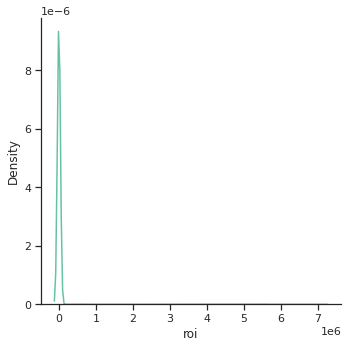

In [ ]:
# look at distribution of ROI and Profit to set threshold for classifications (i.e. hih profit, low profit, loss etc.)

sns.displot(df_new, x='roi', kind="kde")

In [ ]:
# distribution still too right tailed - check out some examples

#df_new.loc[df_new['title'] == 'Crocodile Dundee II']
#df_merged.loc[df_merged['title'] == 'Crocodile Dundee II']
#df_new.loc[df_new['title'] == 'Modern Times']
#df_merged.loc[df_merged['title'] == 'Modern Times']

# budget seems to be v small in some cases still (e.g. Modern Times) but imputing worked well in other (e.g. Crocodile Dundee II).

# Let's simply cap ROI at 50 instead

df_new.loc[df_new['roi'] > 50, 'roi'] = 50

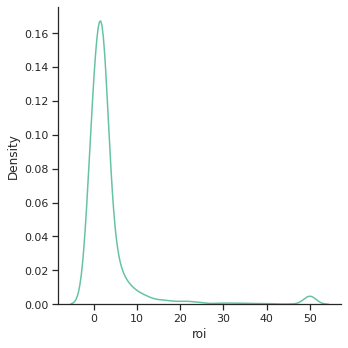

In [ ]:
# look at distribution of ROI and Profit to set threshold for classifications (i.e. hih profit, low profit, loss etc.)

sns.displot(df_new, x='roi', kind="kde")

#note RoI is floored at zero in this model - it's assumed one can't lose more than the money put in (i.e. no leverage)

In [ ]:
# looks like it works: where shall we set thresholds for our target variable?

df_new.quantile([.1, .25, .5, .75], axis = 0) 

,id,release_year,release_month,age,runtime,revenue_adj,budget_adj,profit_adj,roi
0.10,1408.8,1988.0,2.0,6.0,87.0,9.341701e+06,5.285928e+06,-1.281635e+07,-0.51
0.25,9014.5,1999.0,4.0,9.0,94.0,2.994328e+07,1.696963e+07,1.026292e+07,0.44
0.50,14629.0,2005.0,7.0,15.0,104.0,1.031875e+08,4.284739e+07,6.138432e+07,2.03
0.75,58610.5,2011.0,10.0,21.0,117.5,1.498253e+08,5.519147e+07,1.003196e+08,2.92


In [ ]:
# create basic classifier (binary "is profitable?")
# Let's try and identify "top quartile" performers, so the threshold  for the positive class is set at RoI 2.92

df_new['profitable'] = np.where(df_new['roi'] > 2.92, 1, 0)

# create multi-class classifier
# here we can be a bit more nuanced: let's keep trying to find the top quartile, but also introduce categories of RoI < 0 (i.e. a loss) and "everything else" i.e. 0 < RoI < 2.92

df_new['profit_class'] = np.where(df_new['roi'] < 0, 'Loss', # if RoI below zero call it a "Loss"
                     np.where(df_new['roi'] > 2.92, 'Hit', 'Neutral')) #else if RoI is top quartile set "Profit", else set to "Neutral"



In [ ]:
df_new.head(2)

,genres,id,keywords,production_companies,production_countries,release_date,spoken_languages,title,cast,crew,director,producer,exec_producer,writer,screenwriter,actor1,actor2,actor3,actor4,actor5,studio1,prod_country1,key_crew,key_cast,genre_1,genre_2,genre_3,genre_4,genre_5,keyword_1,keyword_2,keyword_3,keyword_4,keyword_5,lang_1,lang_2,lang_3,lang_4,lang_5,release_year,release_month,age,runtime,revenue_adj,budget_adj,profit_adj,roi,profitable,profit_class
0,"[Action, Adventure, Fantasy, Science Fiction]",19995,"[culture clash, future, space war, space colon...","[Ingenious Film Partners, Twentieth Century Fo...","[{'iso_3166_1': 'US', 'name': 'United States o...",2009-12-10,"[English, Español]",Avatar,"[{'cast_id': 242, 'character': 'Jake Sully', '...","[{'credit_id': '52fe48009251416c750aca23', 'de...",James Cameron,James Cameron,Laeta Kalogridis,James Cameron,James Cameron,Zoe Saldana,Sigourney Weaver,Stephen Lang,Michelle Rodriguez,Giovanni Ribisi,Ingenious Film Partners,United States of America,"[James Cameron, James Cameron, James Cameron, ...","[Sam Worthington, Zoe Saldana, Sigourney Weave...",Action,Adventure,Fantasy,Science Fiction,NaN,culture clash,future,space war,space colony,society,English,Español,NaN,NaN,NaN,2009.0,12.0,11.0,162.0,3.466484e+09,2.946797e+08,3.171804e+09,10.76,1,Hit
1,"[Adventure, Fantasy, Action]",285,"[ocean, drug abuse, exotic island, east india ...","[Walt Disney Pictures, Jerry Bruckheimer Films...","[{'iso_3166_1': 'US', 'name': 'United States o...",2007-05-19,[English],Pirates of the Caribbean: At World's End,"[{'cast_id': 4, 'character': 'Captain Jack Spa...","[{'credit_id': '52fe4232c3a36847f800b579', 'de...",Gore Verbinski,Jerry Bruckheimer,Mike Stenson,NaN,Ted Elliott,Orlando Bloom,Keira Knightley,Stellan Skarsgård,Chow Yun-fat,Bill Nighy,Walt Disney Pictures,United States of America,"[Gore Verbinski, Jerry Bruckheimer, Ted Elliot...","[Johnny Depp, Orlando Bloom, Keira Knightley, ...",Adventure,Fantasy,Action,NaN,NaN,ocean,drug abuse,exotic island,east india trading company,love of one's life,English,NaN,NaN,NaN,NaN,2007.0,5.0,13.0,169.0,1.243156e+09,3.880820e+08,8.550740e+08,2.20,0,Neutral


In [ ]:
#this all seems to have worked - let's use df_new going forward (will save original df just in case)

df_merged_old = df_merged
df_merged = df_new

### Feature Engineering Cont.

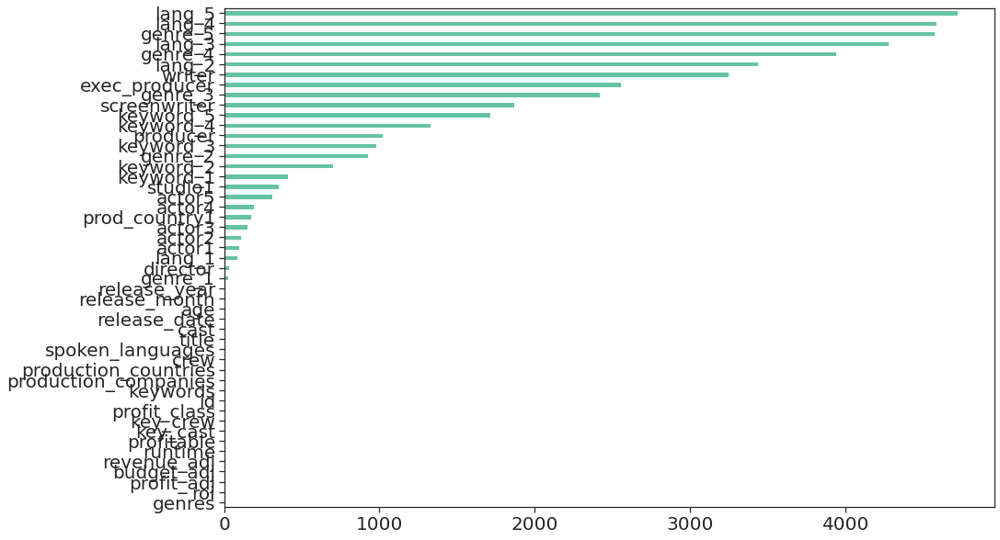

In [ ]:
#Counting NA in new dataset

fig = plt.figure(figsize=(15, 10))
df_merged.isna().sum().sort_values(ascending=True).plot(kind='barh', fontsize=20)

In [ ]:
# create director metrics

# revenue

df_merged = df_merged.sort_values(["director","release_date"])
df_merged['director_prior_rev'] = df_merged.groupby('director')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['director_avg_prior_rev'] = (df_merged.groupby('director')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('director')['title'].cumcount()


# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented
# see here https://stackoverflow.com/questions/18689823/pandas-dataframe-replace-nan-values-with-average-of-columns)

# also - is using zero best here?  would filling NA's with the series mean be better?

df_merged['director_avg_prior_rev'].fillna(0, inplace=True)
#df_merged.head(20)[['title', 'director','revenue_adj','release_year','director_prior_rev','director_avg_prior_rev']]


# profit

df_merged = df_merged.sort_values(["director","release_date"])
df_merged['director_prior_prof'] = df_merged.groupby('director')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['director_avg_prior_prof'] = (df_merged.groupby('director')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('director')['title'].cumcount()
df_merged['director_avg_prior_prof'].fillna(0, inplace=True)

In [ ]:
# create producer metrics - look at profit not revenue as producers are in charge of budgets, profitability

df_merged = df_merged.sort_values(["producer","release_date"])
df_merged['producer_prior_prof'] = df_merged.groupby('producer')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['producer_avg_prior_prof'] = (df_merged.groupby('producer')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('producer')['title'].cumcount()
df_merged.head(20)[['title', 'producer','profit_adj','release_year','producer_prior_prof','producer_avg_prior_prof']]

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented


df_merged['producer_avg_prior_prof'].fillna(0, inplace=True)
df_merged.head(20)[['title', 'producer','profit_adj','release_year','producer_prior_prof','producer_avg_prior_prof']]

,title,producer,profit_adj,release_year,producer_prior_prof,producer_avg_prior_prof
3445,Platoon,A. Kitman Ho,2.598495e+08,1986.0,0.000000e+00,0.000000e+00
3769,Talk Radio,A. Kitman Ho,-1.001498e+06,1988.0,2.598495e+08,2.598495e+08
1221,The Doors,A. Kitman Ho,-6.363042e+06,1991.0,2.588480e+08,1.294240e+08
959,On Deadly Ground,A. Kitman Ho,-1.673418e+06,1994.0,2.524850e+08,8.416165e+07
4424,Fear Clinic,Aaron Drane,1.169411e+07,2014.0,0.000000e+00,0.000000e+00
1983,Meet the Deedles,Aaron Meyerson,-3.005053e+07,1998.0,0.000000e+00,0.000000e+00
3212,The Rose,Aaron Russo,4.487430e+07,1979.0,0.000000e+00,0.000000e+00
3174,Trading Places,Aaron Russo,1.036181e+08,1983.0,4.487430e+07,4.487430e+07
3187,Hamlet 2,Aaron Ryder,1.003196e+08,2008.0,0.000000e+00,0.000000e+00
1800,The Raven,Aaron Ryder,4.285638e+06,2012.0,1.003196e+08,1.003196e+08


In [ ]:
# create studio metrics - look at profit not revenue (as studios have some control of cost/budget, so may impact profitability)

df_merged = df_merged.sort_values(["studio1","release_date"])
df_merged['studio1_prior_prof'] = df_merged.groupby('studio1')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['studio1_avg_prior_prof'] = (df_merged.groupby('studio1')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('studio1')['title'].cumcount()

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented


df_merged['studio1_avg_prior_prof'].fillna(0, inplace=True)
df_merged.head(20)[['title', 'studio1','profit_adj','release_year','studio1_prior_prof','studio1_avg_prior_prof']]

,title,studio1,profit_adj,release_year,studio1_prior_prof,studio1_avg_prior_prof
3839,The Secret in Their Eyes,100 Bares,3.974551e+07,2009.0,0.000000e+00,0.000000e+00
2064,Underdogs,100 Bares,2.297371e+06,2013.0,3.974551e+07,3.974551e+07
3389,Chairman of the Board,101st Street Films,1.003196e+08,1998.0,0.000000e+00,0.000000e+00
197,Harry Potter and the Philosopher's Stone,1492 Pictures,1.240439e+09,2001.0,0.000000e+00,0.000000e+00
276,Harry Potter and the Chamber of Secrets,1492 Pictures,1.109302e+09,2002.0,1.240439e+09,1.240439e+09
191,Harry Potter and the Prisoner of Azkaban,1492 Pictures,9.057703e+08,2004.0,2.349742e+09,1.174871e+09
368,Percy Jackson: Sea of Monsters,1492 Pictures,9.715440e+07,2013.0,3.255512e+09,1.085171e+09
3603,Lone Wolf McQuade,1818,1.504882e+07,1983.0,0.000000e+00,0.000000e+00
2872,From Justin to Kelly,19 Entertainment,-9.910676e+06,2003.0,0.000000e+00,0.000000e+00
4024,The Spectacular Now,21 Laps Entertainment,5.002079e+06,2013.0,0.000000e+00,0.000000e+00


In [ ]:
df_merged['producer'].value_counts()

Tim Bevan             35
Joel Silver           33
Brian Grazer          33
Scott Rudin           31
Jerry Bruckheimer     29
                      ..
Marianne Maddalena     1
Mariela Besuievski     1
Marina Gefter          1
Marina Grasic          1
Jonathan McHugh        1
Name: producer, Length: 1762, dtype: int64

In [ ]:
# create actor metrics

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented

# revenue

df_merged = df_merged.sort_values(["actor1","release_date"])
df_merged['actor1_prior_rev'] = df_merged.groupby('actor1')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['actor1_avg_prior_rev'] = (df_merged.groupby('actor1')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('actor1')['title'].cumcount()
df_merged['actor1_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor2","release_date"])
df_merged['actor2_prior_rev'] = df_merged.groupby('actor2')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['actor2_avg_prior_rev'] = (df_merged.groupby('actor2')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('actor2')['title'].cumcount()
df_merged['actor2_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor3","release_date"])
df_merged['actor3_prior_rev'] = df_merged.groupby('actor3')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['actor3_avg_prior_rev'] = (df_merged.groupby('actor3')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('actor3')['title'].cumcount()
df_merged['actor3_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor4","release_date"])
df_merged['actor4_prior_rev'] = df_merged.groupby('actor4')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['actor4_avg_prior_rev'] = (df_merged.groupby('actor4')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('actor4')['title'].cumcount()
df_merged['actor4_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor5","release_date"])
df_merged['actor5_prior_rev'] = df_merged.groupby('actor5')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['actor5_avg_prior_rev'] = (df_merged.groupby('actor5')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('actor5')['title'].cumcount()
df_merged['actor5_avg_prior_rev'].fillna(0, inplace=True)

df_merged['key_cast_prior_rev'] = df_merged['actor1_prior_rev'] + df_merged['actor2_prior_rev'] + df_merged['actor3_prior_rev'] + df_merged['actor4_prior_rev'] + df_merged['actor5_prior_rev']
df_merged['key_cast_avg_prior_rev'] = df_merged['key_cast_prior_rev'] / 5

# profit

df_merged = df_merged.sort_values(["actor1","release_date"])
df_merged['actor1_prior_prof'] = df_merged.groupby('actor1')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['actor1_avg_prior_prof'] = (df_merged.groupby('actor1')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('actor1')['title'].cumcount()
df_merged['actor1_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor2","release_date"])
df_merged['actor2_prior_prof'] = df_merged.groupby('actor2')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['actor2_avg_prior_prof'] = (df_merged.groupby('actor2')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('actor2')['title'].cumcount()
df_merged['actor2_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor3","release_date"])
df_merged['actor3_prior_prof'] = df_merged.groupby('actor3')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['actor3_avg_prior_prof'] = (df_merged.groupby('actor3')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('actor3')['title'].cumcount()
df_merged['actor3_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor4","release_date"])
df_merged['actor4_prior_prof'] = df_merged.groupby('actor4')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['actor4_avg_prior_prof'] = (df_merged.groupby('actor4')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('actor4')['title'].cumcount()
df_merged['actor4_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["actor5","release_date"])
df_merged['actor5_prior_prof'] = df_merged.groupby('actor5')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['actor5_avg_prior_prof'] = (df_merged.groupby('actor5')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('actor5')['title'].cumcount()
df_merged['actor5_avg_prior_prof'].fillna(0, inplace=True)

df_merged['key_cast_prior_prof'] = df_merged['actor1_prior_prof'] + df_merged['actor2_prior_prof'] + df_merged['actor3_prior_prof'] + df_merged['actor4_prior_prof'] + df_merged['actor5_prior_prof']
df_merged['key_cast_avg_prior_prof'] = df_merged['key_cast_prior_prof'] / 5






In [ ]:
# create genre metrics (only using top 3 genres due to prevalence of NaN's in 4 and 5)

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented

#revenue

df_merged = df_merged.sort_values(["genre_1","release_date"])
df_merged['genre_1_prior_rev'] = df_merged.groupby('genre_1')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['genre_1_avg_prior_rev'] = (df_merged.groupby('genre_1')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('genre_1')['title'].cumcount()
df_merged['genre_1_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["genre_2","release_date"])
df_merged['genre_2_prior_rev'] = df_merged.groupby('genre_2')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['genre_2_avg_prior_rev'] = (df_merged.groupby('genre_2')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('genre_2')['title'].cumcount()
df_merged['genre_2_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["genre_3","release_date"])
df_merged['genre_3_prior_rev'] = df_merged.groupby('genre_3')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['genre_3_avg_prior_rev'] = (df_merged.groupby('genre_3')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('genre_3')['title'].cumcount()
df_merged['genre_3_avg_prior_rev'].fillna(0, inplace=True)

df_merged['genre_prior_rev'] = df_merged['genre_1_prior_rev'] + df_merged['genre_2_prior_rev'] + df_merged['genre_3_prior_rev'] 
df_merged['genre_avg_prior_rev'] = df_merged['genre_prior_rev'] / 3

df_merged['genre_prior_rev'].fillna(0, inplace=True)
df_merged['genre_avg_prior_rev'].fillna(0, inplace=True)



# profit

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented
df_merged = df_merged.sort_values(["genre_1","release_date"])
df_merged['genre_1_prior_prof'] = df_merged.groupby('genre_1')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['genre_1_avg_prior_prof'] = (df_merged.groupby('genre_1')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('genre_1')['title'].cumcount()
df_merged['genre_1_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["genre_2","release_date"])
df_merged['genre_2_prior_prof'] = df_merged.groupby('genre_2')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['genre_2_avg_prior_prof'] = (df_merged.groupby('genre_2')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('genre_2')['title'].cumcount()
df_merged['genre_2_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["genre_3","release_date"])
df_merged['genre_3_prior_prof'] = df_merged.groupby('genre_3')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['genre_3_avg_prior_prof'] = (df_merged.groupby('genre_3')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('genre_3')['title'].cumcount()
df_merged['genre_3_avg_prior_prof'].fillna(0, inplace=True)

df_merged['genre_prior_prof'] = df_merged['genre_1_prior_prof'] + df_merged['genre_2_prior_prof'] + df_merged['genre_3_prior_prof'] 
df_merged['genre_avg_prior_prof'] = df_merged['genre_prior_prof'] / 3

df_merged['genre_prior_prof'].fillna(0, inplace=True)
df_merged['genre_avg_prior_prof'].fillna(0, inplace=True)

In [ ]:
# create keyword metrics (only using top 3 genres due to prevalence of NaN's in 4 and 5)

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented

#revenue

df_merged = df_merged.sort_values(["keyword_1","release_date"])
df_merged['keyword_1_prior_rev'] = df_merged.groupby('keyword_1')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['keyword_1_avg_prior_rev'] = (df_merged.groupby('keyword_1')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('keyword_1')['title'].cumcount()
df_merged['keyword_1_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["keyword_2","release_date"])
df_merged['keyword_2_prior_rev'] = df_merged.groupby('keyword_2')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['keyword_2_avg_prior_rev'] = (df_merged.groupby('keyword_2')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('keyword_2')['title'].cumcount()
df_merged['keyword_2_avg_prior_rev'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["keyword_3","release_date"])
df_merged['keyword_3_prior_rev'] = df_merged.groupby('keyword_3')['revenue_adj'].cumsum() - df_merged['revenue_adj']
df_merged['keyword_3_avg_prior_rev'] = (df_merged.groupby('keyword_3')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('keyword_3')['title'].cumcount()
df_merged['keyword_3_avg_prior_rev'].fillna(0, inplace=True)

df_merged['keyword_prior_rev'] = df_merged['keyword_1_prior_rev'] + df_merged['keyword_2_prior_rev'] + df_merged['keyword_3_prior_rev'] 
df_merged['keyword_avg_prior_rev'] = df_merged['keyword_prior_rev'] / 3

df_merged['keyword_prior_rev'].fillna(0, inplace=True)
df_merged['keyword_avg_prior_rev'].fillna(0, inplace=True)


# profit

# note: need to replace NaN's in the TEST SET with the mean from the TRAINING set (when train/test split is implemented
df_merged = df_merged.sort_values(["keyword_1","release_date"])
df_merged['keyword_1_prior_prof'] = df_merged.groupby('keyword_1')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['keyword_1_avg_prior_prof'] = (df_merged.groupby('keyword_1')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('keyword_1')['title'].cumcount()
df_merged['keyword_1_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["keyword_2","release_date"])
df_merged['keyword_2_prior_prof'] = df_merged.groupby('keyword_2')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['keyword_2_avg_prior_prof'] = (df_merged.groupby('keyword_2')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('keyword_2')['title'].cumcount()
df_merged['keyword_2_avg_prior_prof'].fillna(0, inplace=True)

df_merged = df_merged.sort_values(["keyword_3","release_date"])
df_merged['keyword_3_prior_prof'] = df_merged.groupby('keyword_3')['profit_adj'].cumsum() - df_merged['profit_adj']
df_merged['keyword_3_avg_prior_prof'] = (df_merged.groupby('keyword_3')['profit_adj'].cumsum() - df_merged['profit_adj']) / df_merged.groupby('keyword_3')['title'].cumcount()
df_merged['keyword_3_avg_prior_prof'].fillna(0, inplace=True)

df_merged['keyword_prior_prof'] = df_merged['keyword_1_prior_prof'] + df_merged['keyword_2_prior_prof'] + df_merged['keyword_3_prior_prof'] 
df_merged['keyword_avg_prior_prof'] = df_merged['keyword_prior_prof'] / 3

df_merged['keyword_prior_prof'].fillna(0, inplace=True)
df_merged['keyword_avg_prior_prof'].fillna(0, inplace=True)



In [ ]:
#drop un-needed calculation columns
df_merged.drop(['cast','crew'], axis='columns', inplace=True)
df_merged.drop(['director','producer','writer','exec_producer','screenwriter'], axis='columns', inplace=True)

df_merged.drop(['actor1','actor2','actor3','actor4','actor5'], axis='columns', inplace=True)
df_merged.drop(['actor1_prior_rev','actor1_avg_prior_rev','actor2_prior_rev','actor2_avg_prior_rev','actor3_prior_rev','actor3_avg_prior_rev',
                'actor4_prior_rev','actor4_avg_prior_rev','actor5_prior_rev','actor5_avg_prior_rev'], axis='columns', inplace=True)
df_merged.drop(['actor1_prior_prof','actor1_avg_prior_prof','actor2_prior_prof','actor2_avg_prior_prof','actor3_prior_prof','actor3_avg_prior_prof',
                'actor4_prior_prof','actor4_avg_prior_prof','actor5_prior_prof','actor5_avg_prior_prof'], axis='columns', inplace=True)



df_merged.drop(['genre_2','genre_3','genre_4','genre_5'], axis='columns', inplace=True)
df_merged.drop(['genre_1_prior_rev','genre_1_avg_prior_rev','genre_2_prior_rev','genre_2_avg_prior_rev','genre_3_prior_rev','genre_3_avg_prior_rev'],
               axis='columns', inplace=True)
df_merged.drop(['genre_1_prior_prof','genre_1_avg_prior_prof','genre_2_prior_prof','genre_2_avg_prior_prof','genre_3_prior_prof','genre_3_avg_prior_prof'],
               axis='columns', inplace=True)

df_merged.drop(['keyword_2','keyword_3','keyword_4','keyword_5'], axis='columns', inplace=True)
df_merged.drop(['keyword_1_prior_rev','keyword_1_avg_prior_rev','keyword_2_prior_rev','keyword_2_avg_prior_rev','keyword_3_prior_rev','keyword_3_avg_prior_rev'],
               axis='columns', inplace=True)
df_merged.drop(['keyword_1_prior_prof','keyword_1_avg_prior_prof','keyword_2_prior_prof','keyword_2_avg_prior_prof','keyword_3_prior_prof','keyword_3_avg_prior_prof'],
 axis='columns', inplace=True)

df_merged.drop(['lang_2','lang_3','lang_4','lang_5'], axis='columns', inplace=True)


In [ ]:
# create average revenue per year column (hopefully will react to the observed phenomenon of average revenue growing over time in the dataset)

df_merged = df_merged.sort_values(["release_date","revenue_adj"])

df_merged['avg_rev_ytd'] = (df_merged.groupby('release_year')['revenue_adj'].cumsum() - df_merged['revenue_adj']) / df_merged.groupby('release_year')['title'].cumcount()
df_merged['avg_rev_ytd'].fillna(method='bfill', inplace=True)

In [ ]:
# final cleaning up of NaN's

# turn offending cat columns to string temporarily so 'unknown can be added
for col in ['prod_country1','lang_1','genre_1','keyword_1','studio1']:
    df_merged[col] = df_merged[col].astype('string')


# replace NaN's in columns we want to keep
number_cols = ['producer_prior_prof','key_cast_avg_prior_prof','key_cast_prior_prof','key_cast_avg_prior_rev','studio1_prior_prof','runtime',
               'avg_rev_ytd','director_prior_rev','director_prior_prof','key_cast_prior_rev','profit_adj','revenue_adj','age','budget_adj']

word_cols = ['keyword_1','studio1','prod_country1','lang_1','genre_1']

date_cols = ['release_month','release_year','release_date']

for col in number_cols:
  df_merged[col] = df_merged[col].fillna(0)

for col in word_cols:
#  df_merged[col] = df_merged[col].cat.add_categories('Unknown')
  df_merged[col] = df_merged[col].fillna('Unknown')
#  df_merged[col] = df_merged[col].astype('category')    #undoing reclassification step above

for col in date_cols:
  df_merged[col] = df_merged[col].dropna(axis=0)

#reset index since we've removed some null rows
#df_merged.reset_index(inplace=True)

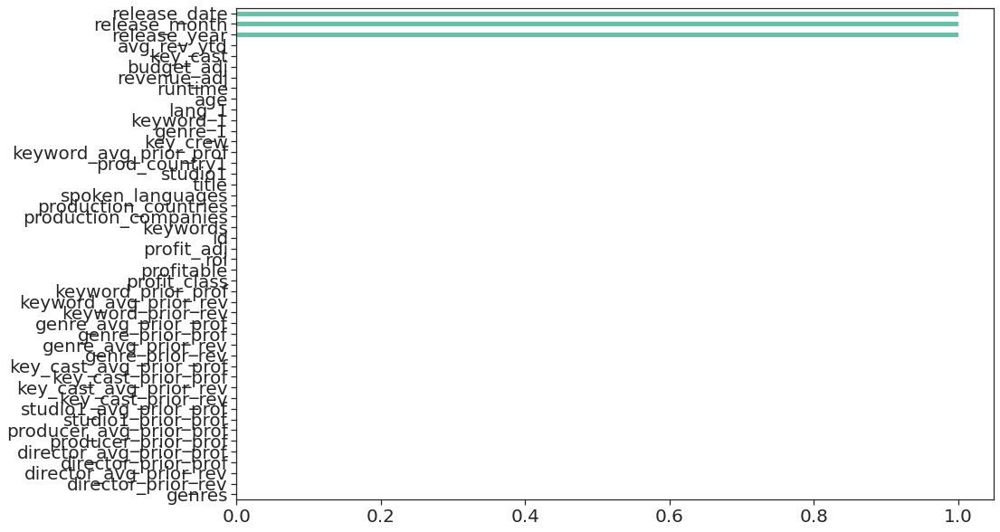

In [ ]:
#Counting NA in new dataset

fig = plt.figure(figsize=(15, 10))
df_merged.isna().sum().sort_values(ascending=True).plot(kind='barh', fontsize=20)

In [ ]:
# reduce number of features to be one hot encoded by 1) consolidating release_month to high_rev_month and 2) dropping release_year in favour of age 



df_merged['high_rev_month'] = np.where(df_merged['release_month'] == 5.0, 1, 
                     np.where(df_merged['release_month'] == 6.0, 1,
                     np.where(df_merged['release_month'] == 7.0, 1,
                     np.where(df_merged['release_month'] == 11.0, 1,
                     np.where(df_merged['release_month'] == 12.0, 1, 0))))) 

df_merged.drop(['release_month','release_year'], axis='columns', inplace=True)

df_merged.head(20)[['title','release_date','high_rev_month']]

,title,release_date,high_rev_month
4592,Intolerance,1916-09-04,0
4661,The Big Parade,1925-11-05,1
2638,Metropolis,1927-01-10,0
4457,Pandora's Box,1929-01-30,0
4594,The Broadway Melody,1929-02-08,0
3804,Hell's Angels,1930-11-15,1
3611,A Farewell to Arms,1932-12-08,1
4570,42nd Street,1933-02-02,0
4673,She Done Him Wrong,1933-02-09,0
4604,It Happened One Night,1934-02-22,0


### Create df for modelling

In [ ]:
# create new df with just columns needed for modelling

data = df_merged
data.head()

,genres,id,keywords,production_companies,production_countries,release_date,spoken_languages,title,studio1,prod_country1,key_crew,key_cast,genre_1,keyword_1,lang_1,age,runtime,revenue_adj,budget_adj,profit_adj,roi,profitable,profit_class,director_prior_rev,director_avg_prior_rev,director_prior_prof,director_avg_prior_prof,producer_prior_prof,producer_avg_prior_prof,studio1_prior_prof,studio1_avg_prior_prof,key_cast_prior_rev,key_cast_avg_prior_rev,key_cast_prior_prof,key_cast_avg_prior_prof,genre_prior_rev,genre_avg_prior_rev,genre_prior_prof,genre_avg_prior_prof,keyword_prior_rev,keyword_avg_prior_rev,keyword_prior_prof,keyword_avg_prior_prof,avg_rev_ytd,high_rev_month
4592,[Drama],3059,"[usa, naivety, intolerance, mill, marriage]","[Triangle Film Corporation, Wark Producing Corp.]","[{'iso_3166_1': 'US', 'name': 'United States o...",1916-09-04,[English],Intolerance,Triangle Film Corporation,United States of America,"[Tod Browning, Anita Loos, Frank E. Woods, D.W...","[Lillian Gish, Mae Marsh, Robert Harron, F.A. ...",Drama,usa,English,104.0,197.0,6.583028e+07,3.026220e+06,6.280406e+07,20.75,1,Hit,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,1.498253e+08,0
4661,"[Drama, Romance, War]",3060,"[world war i, silent film]",[Metro-Goldwyn-Mayer (MGM)],"[{'iso_3166_1': 'US', 'name': 'United States o...",1925-11-05,[],The Big Parade,Metro-Goldwyn-Mayer (MGM),United States of America,"[Irving Thalberg, King Vidor, Harry Behn]","[John Gilbert, Renée Adorée, Hobart Bosworth, ...",Drama,world war i,Unknown,95.0,151.0,1.443574e+08,1.607616e+06,1.427498e+08,50.00,1,Hit,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,6.583028e+07,2.194343e+07,6.280406e+07,2.093469e+07,0.0,0.0,0.0,0.0,1.498253e+08,1
2638,"[Drama, Science Fiction]",19,"[man vs machine, underground world, inventor, ...","[Paramount Pictures, Universum Film (UFA)]","[{'iso_3166_1': 'DE', 'name': 'Germany'}]",1927-01-10,[No Language],Metropolis,Paramount Pictures,Germany,"[Erich Pommer, Fritz Lang, Fritz Lang, Thea vo...","[Brigitte Helm, Alfred Abel, Gustav Fröhlich, ...",Drama,man vs machine,No Language,93.0,153.0,4.102147e+06,5.841451e+08,-5.800430e+08,-0.99,0,Loss,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,1.498253e+08,0
4457,"[Drama, Thriller, Romance]",905,"[london england, casino, irony, forbidden love...",[Nero Films],"[{'iso_3166_1': 'DE', 'name': 'Germany'}]",1929-01-30,[Deutsch],Pandora's Box,Nero Films,Germany,"[G.W. Pabst, Ladislaus Vajda, Seymour Nebenzal]","[Louise Brooks, Fritz Kortner, Francis Lederer...",Drama,london england,Deutsch,91.0,109.0,1.498253e+08,4.950575e+07,1.003196e+08,2.03,0,Neutral,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,2.142898e+08,7.142994e+07,-3.744891e+08,-1.248297e+08,0.0,0.0,0.0,0.0,1.498253e+08,0
4594,"[Drama, Music, Romance]",65203,"[musical, singer, pre-code, wisecrack humor, e...",[Metro-Goldwyn-Mayer (MGM)],"[{'iso_3166_1': 'US', 'name': 'United States o...",1929-02-08,[English],The Broadway Melody,Metro-Goldwyn-Mayer (MGM),United States of America,"[Irving Thalberg, Lawrence Weingarten, Edmund ...","[Charles King, Anita Page, Bessie Love, Nacio ...",Drama,musical,English,91.0,100.0,2.641818e+07,2.297496e+06,2.412068e+07,10.50,1,Hit,0.0,0.0,0.0,0.0,1.427498e+08,1.427498e+08,1.427498e+08,1.427498e+08,0.0,0.0,0.0,0.0,5.139404e+08,1.713135e+08,-1.738500e+08,-5.795001e+07,0.0,0.0,0.0,0.0,1.498253e+08,0


In [ ]:
# remove low frequency values in columns to be one hot encoded

# with help from https://stackoverflow.com/questions/32511061/remove-low-frequency-values-from-pandas-dataframe

for col in ['prod_country1','lang_1','genre_1','keyword_1','studio1']:
    df_merged[col] = df_merged[col].astype('string')

small_threshold = 5    # can be varied to reduce final feature count
large_threshold = 20

small_one_hot_cols = ['keyword_1','studio1']

for col in small_one_hot_cols:
  vc = data[col].value_counts()
  vals_to_remove = vc[vc <= small_threshold].index.values
  data[col].loc[data[col].isin(vals_to_remove)] = 'Other'
  data[col] = data[col].astype('category')

large_one_hot_cols = ['genre_1','prod_country1','lang_1']

for col in large_one_hot_cols:
  vc = data[col].value_counts()
  vals_to_remove = vc[vc <= large_threshold].index.values
  data[col].loc[data[col].isin(vals_to_remove)] = 'Other'
  data[col] = data[col].astype('category')
  

In [ ]:
data['prod_country1'].value_counts()

United States of America    3102
United Kingdom               374
Canada                       220
Other                        208
Germany                      200
Unknown                      174
France                       174
Australia                     87
India                         42
China                         40
Japan                         34
Spain                         34
Italy                         26
Ireland                       22
Hong Kong                     22
Mexico                        22
New Zealand                   22
Name: prod_country1, dtype: int64

In [ ]:
data['genre_1'].value_counts()

Drama              1207
Comedy             1042
Action              754
Adventure           339
Horror              300
Crime               195
Thriller            194
Animation           123
Fantasy             117
Romance             106
Science Fiction      96
Documentary          89
Family               56
Mystery              41
Music                34
Unknown              28
Western              27
History              25
War                  24
Other                 6
Name: genre_1, dtype: int64

In [ ]:
data['keyword_1'].value_counts()

Other               1900
Unknown              412
based on novel        94
independent film      87
new york              73
                    ... 
shyness                6
single parent          6
dolphin                6
skateboarding          6
new jersey             6
Name: keyword_1, Length: 171, dtype: int64

In [ ]:
data['lang_1'].value_counts()

English      4102
Other         131
Français      108
Unknown        86
Español        84
Deutsch        61
العربية        33
普通话            32
Italiano       32
Pусский        31
Český          30
广州话 / 廣州話      28
日本語            23
हिन्दी         22
Name: lang_1, dtype: int64

In [ ]:
data['studio1'].value_counts()

Other                    1665
Unknown                   351
Paramount Pictures        281
Universal Pictures        260
Columbia Pictures         200
                         ... 
Tig Productions             6
Vertigo Entertainment       6
Walt Disney                 6
Working Title Films         6
2929 Productions            6
Name: studio1, Length: 99, dtype: int64

In [ ]:
# one hot encoding categoricals

#for col in ["release_year","release_month","genre_1","keyword_1","prod_country1","studio1"]:      # this may be redundant vs. code above?
 #   data[col] = data[col].astype('category')


#data = pd.get_dummies(data, columns=['release_month'], prefix = ['month'])    # removed in current iteration of code: replaced by age and high_profit_month
#data = pd.get_dummies(data, columns=['release_year'], prefix = ['year'])      # removed in current iteration of code: replaced by age and high_profit_month
data = pd.get_dummies(data, columns=['genre_1'], prefix = ['genre'])
data = pd.get_dummies(data, columns=['prod_country1'], prefix = ['pc'])
data = pd.get_dummies(data, columns=['keyword_1'], prefix = ['kw'])
data = pd.get_dummies(data, columns=['lang_1'], prefix = ['lang'])
data = pd.get_dummies(data, columns=['studio1'], prefix = ['stud'])

In [ ]:
#final drop of un-needed columns from data df to be used

data.drop(['genres','keywords','production_companies','production_countries','release_date','spoken_languages','title','key_crew','key_cast'], axis='columns', inplace=True)

In [ ]:
# drop columns that aren't known at production time (may need to bring back for regression later)

data.drop(['revenue_adj','profit_adj','roi'], axis='columns', inplace=True)
data.drop(['id'], axis='columns',inplace=True)

In [ ]:
# create df for multi class prediction

data_mc = data.copy()
data_mc.drop(['profitable'], axis='columns',inplace=True)

In [ ]:
# drop profit_class from df to be used for binary classification

data.drop(['profit_class'], axis='columns',inplace=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4803 entries, 4592 to 4553
Columns: 347 entries, age to stud_Yash Raj Films
dtypes: float64(24), int64(2), uint8(321)
memory usage: 2.5 MB


In [ ]:
data.head()

,age,runtime,budget_adj,profitable,director_prior_rev,director_avg_prior_rev,director_prior_prof,director_avg_prior_prof,producer_prior_prof,producer_avg_prior_prof,studio1_prior_prof,studio1_avg_prior_prof,key_cast_prior_rev,key_cast_avg_prior_rev,key_cast_prior_prof,key_cast_avg_prior_prof,genre_prior_rev,genre_avg_prior_rev,genre_prior_prof,genre_avg_prior_prof,keyword_prior_rev,keyword_avg_prior_rev,keyword_prior_prof,keyword_avg_prior_prof,avg_rev_ytd,high_rev_month,genre_Action,genre_Adventure,genre_Animation,genre_Comedy,genre_Crime,genre_Documentary,genre_Drama,genre_Family,genre_Fantasy,genre_History,genre_Horror,genre_Music,genre_Mystery,genre_Other,...,stud_Orion Pictures,stud_Other,stud_Paramount Pictures,stud_Paramount Vantage,stud_Plan B Entertainment,stud_PolyGram Filmed Entertainment,stud_Regency Enterprises,stud_Relativity Media,stud_Revolution Films,stud_Revolution Studios,stud_Rhombus Media,stud_Rogue Pictures,stud_Scott Rudin Productions,stud_Screen Gems,stud_Sidney Kimmel Entertainment,stud_Silver Pictures,stud_Sony Pictures Classics,stud_Spyglass Entertainment,stud_Studio Babelsberg,stud_StudioCanal,stud_Summit Entertainment,stud_The Weinstein Company,stud_Tig Productions,stud_Touchstone Pictures,stud_TriStar Pictures,stud_Twentieth Century Fox Film Corporation,stud_United Artists,stud_Universal Pictures,stud_Universal Studios,stud_Unknown,stud_Vertigo Entertainment,stud_Village Roadshow Pictures,stud_Walt Disney,stud_Walt Disney Pictures,stud_Warner Bros.,stud_Wild Bunch,stud_WingNut Films,stud_Working Title Films,stud_Worldview Entertainment,stud_Yash Raj Films
4592,104.0,197.0,3.026220e+06,1,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,1.498253e+08,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4661,95.0,151.0,1.607616e+06,1,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,6.583028e+07,2.194343e+07,6.280406e+07,2.093469e+07,0.0,0.0,0.0,0.0,1.498253e+08,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2638,93.0,153.0,5.841451e+08,0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,1.498253e+08,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4457,91.0,109.0,4.950575e+07,0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,2.142898e+08,7.142994e+07,-3.744891e+08,-1.248297e+08,0.0,0.0,0.0,0.0,1.498253e+08,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4594,91.0,100.0,2.297496e+06,1,0.0,0.0,0.0,0.0,1.427498e+08,1.427498e+08,1.427498e+08,1.427498e+08,0.0,0.0,0.0,0.0,5.139404e+08,1.713135e+08,-1.738500e+08,-5.795001e+07,0.0,0.0,0.0,0.0,1.498253e+08,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
#output engineered data to csv

#data.to_csv(r'data_for_modelling.csv')

In [ ]:
# scale data 

from sklearn.preprocessing import minmax_scale

data_scaled = pd.DataFrame(minmax_scale(data), columns=data.columns.values)
data_scaled['profitable'] = data_scaled['profitable'].astype('int')

df1 = data_mc.pop('profit_class')
data_mc_scaled = pd.DataFrame(minmax_scale(data_mc), columns=data_mc.columns.values)

data_mc_scaled['profit_class'] = df1
data_mc_scaled['profit_class'] = data_mc_scaled['profit_class'].astype('category')

In [ ]:
data_mc_scaled.profit_class.dtype

CategoricalDtype(categories=['Hit', 'Loss', 'Neutral'], ordered=False)

In [ ]:
data_scaled.head()

,age,runtime,budget_adj,profitable,director_prior_rev,director_avg_prior_rev,director_prior_prof,director_avg_prior_prof,producer_prior_prof,producer_avg_prior_prof,studio1_prior_prof,studio1_avg_prior_prof,key_cast_prior_rev,key_cast_avg_prior_rev,key_cast_prior_prof,key_cast_avg_prior_prof,genre_prior_rev,genre_avg_prior_rev,genre_prior_prof,genre_avg_prior_prof,keyword_prior_rev,keyword_avg_prior_rev,keyword_prior_prof,keyword_avg_prior_prof,avg_rev_ytd,high_rev_month,genre_Action,genre_Adventure,genre_Animation,genre_Comedy,genre_Crime,genre_Documentary,genre_Drama,genre_Family,genre_Fantasy,genre_History,genre_Horror,genre_Music,genre_Mystery,genre_Other,...,stud_Orion Pictures,stud_Other,stud_Paramount Pictures,stud_Paramount Vantage,stud_Plan B Entertainment,stud_PolyGram Filmed Entertainment,stud_Regency Enterprises,stud_Relativity Media,stud_Revolution Films,stud_Revolution Studios,stud_Rhombus Media,stud_Rogue Pictures,stud_Scott Rudin Productions,stud_Screen Gems,stud_Sidney Kimmel Entertainment,stud_Silver Pictures,stud_Sony Pictures Classics,stud_Spyglass Entertainment,stud_Studio Babelsberg,stud_StudioCanal,stud_Summit Entertainment,stud_The Weinstein Company,stud_Tig Productions,stud_Touchstone Pictures,stud_TriStar Pictures,stud_Twentieth Century Fox Film Corporation,stud_United Artists,stud_Universal Pictures,stud_Universal Studios,stud_Unknown,stud_Vertigo Entertainment,stud_Village Roadshow Pictures,stud_Walt Disney,stud_Walt Disney Pictures,stud_Warner Bros.,stud_Wild Bunch,stud_WingNut Films,stud_Working Title Films,stud_Worldview Entertainment,stud_Yash Raj Films
0,1.000000,0.564815,0.005181,1,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000000,0.000000,0.002097,0.002097,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.913462,0.422840,0.002752,1,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000236,0.000236,0.002448,0.002448,0.0,0.0,0.006677,0.006677,0.119546,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.894231,0.429012,1.000000,0,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000000,0.000000,0.002097,0.002097,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.875000,0.293210,0.084749,0,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000768,0.000768,0.000000,0.000000,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.875000,0.265432,0.003933,1,0.0,0.0,0.010652,0.085481,0.029326,0.122159,0.017642,0.283425,0.0,0.0,0.017351,0.017351,0.001841,0.001841,0.001123,0.001123,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
data_mc_scaled.head()

,age,runtime,budget_adj,director_prior_rev,director_avg_prior_rev,director_prior_prof,director_avg_prior_prof,producer_prior_prof,producer_avg_prior_prof,studio1_prior_prof,studio1_avg_prior_prof,key_cast_prior_rev,key_cast_avg_prior_rev,key_cast_prior_prof,key_cast_avg_prior_prof,genre_prior_rev,genre_avg_prior_rev,genre_prior_prof,genre_avg_prior_prof,keyword_prior_rev,keyword_avg_prior_rev,keyword_prior_prof,keyword_avg_prior_prof,avg_rev_ytd,high_rev_month,genre_Action,genre_Adventure,genre_Animation,genre_Comedy,genre_Crime,genre_Documentary,genre_Drama,genre_Family,genre_Fantasy,genre_History,genre_Horror,genre_Music,genre_Mystery,genre_Other,genre_Romance,...,stud_Other,stud_Paramount Pictures,stud_Paramount Vantage,stud_Plan B Entertainment,stud_PolyGram Filmed Entertainment,stud_Regency Enterprises,stud_Relativity Media,stud_Revolution Films,stud_Revolution Studios,stud_Rhombus Media,stud_Rogue Pictures,stud_Scott Rudin Productions,stud_Screen Gems,stud_Sidney Kimmel Entertainment,stud_Silver Pictures,stud_Sony Pictures Classics,stud_Spyglass Entertainment,stud_Studio Babelsberg,stud_StudioCanal,stud_Summit Entertainment,stud_The Weinstein Company,stud_Tig Productions,stud_Touchstone Pictures,stud_TriStar Pictures,stud_Twentieth Century Fox Film Corporation,stud_United Artists,stud_Universal Pictures,stud_Universal Studios,stud_Unknown,stud_Vertigo Entertainment,stud_Village Roadshow Pictures,stud_Walt Disney,stud_Walt Disney Pictures,stud_Warner Bros.,stud_Wild Bunch,stud_WingNut Films,stud_Working Title Films,stud_Worldview Entertainment,stud_Yash Raj Films,profit_class
0,1.000000,0.564815,0.005181,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000000,0.000000,0.002097,0.002097,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Hit
1,0.913462,0.422840,0.002752,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000236,0.000236,0.002448,0.002448,0.0,0.0,0.006677,0.006677,0.119546,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neutral
2,0.894231,0.429012,1.000000,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000000,0.000000,0.002097,0.002097,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neutral
3,0.875000,0.293210,0.084749,0.0,0.0,0.010652,0.085481,0.014708,0.053585,0.014158,0.227449,0.0,0.0,0.017351,0.017351,0.000768,0.000768,0.000000,0.000000,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Hit
4,0.875000,0.265432,0.003933,0.0,0.0,0.010652,0.085481,0.029326,0.122159,0.017642,0.283425,0.0,0.0,0.017351,0.017351,0.001841,0.001841,0.001123,0.001123,0.0,0.0,0.006677,0.006677,0.119546,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neutral


#Predictive Modelling


### Preparation

In [ ]:
# import libraries

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
#import matplotlib.pylab as plt
#import seaborn as sns
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import classification_report
#from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import (classification_report, roc_curve, 
                             precision_recall_curve, roc_auc_score, 
                             average_precision_score)
from matplotlib.colors import ListedColormap

cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

In [ ]:
# what is base rate of classifications in the population?

data_scaled["profitable"].value_counts()



0    3604
1    1199
Name: profitable, dtype: int64

In [ ]:
# a naive classifier predicting the majority class would predit ~ 25% profitable movies.
data_scaled["profitable"].mean()

0.24963564438892358

In [ ]:
data_mc_scaled["profit_class"].value_counts()

Neutral    2716
Hit        1199
Loss        888
Name: profit_class, dtype: int64

In [ ]:
# set up modelling problem

# binary classification

# reorder columns to set x and y more easily
df2 = data_scaled.pop('profitable')
data_scaled['profitable'] = df2
#set x and y 
column_names = data_scaled.columns
predictor_columns = column_names[:-1]
X = data_scaled[predictor_columns]
Y = data_scaled.profitable
# Break data into train/test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# multi-class classifer (use lower case x and y to differentiate)

# reorder columns to set x and y more easily
df3 = data_mc_scaled.pop('profit_class')
data_mc_scaled['profit_class'] = df3
#set x and y 
column_names_mc = data_mc_scaled.columns
predictor_columns_mc = column_names_mc[:-1]
x = data_mc_scaled[predictor_columns_mc]
#y = data_mc_scaled.profit_class
y, cat_names = data_mc_scaled['profit_class'].factorize()
# Break data into train/test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)



#get model results

def basic_results(model):
  print ( "Accuracy on Training Set = %.4f" % accuracy_score(model.predict(X_train), Y_train) )

  scores = cross_val_score(model, X_train, Y_train, scoring="accuracy", cv=5)
  print ("Cross Validated Training Accuracy: %0.3f +/- %0.3f" % (scores.mean(), scores.std()))

  avg_auc = cross_val_score(model, X_train, Y_train, cv=5, scoring="roc_auc").mean()
  print("Cross Validated Training AUC", round(avg_auc,4))

def basic_mc_results(model):
  print ( "Accuracy on Training Set = %.4f" % accuracy_score(model.predict(x_train), y_train) )

  scores = cross_val_score(model, x_train, y_train, scoring="accuracy", cv=5)
  print ("Cross Validated Training Accuracy: %0.3f +/- %0.3f" % (scores.mean(), scores.std()))

  
  y_preds = model.predict(x_train)
  
  print("")
  print(classification_report(y_train, y_preds, target_names=cat_names))



  

In [ ]:
cat_names

CategoricalIndex(['Hit', 'Neutral', 'Loss'], categories=['Hit', 'Loss', 'Neutral'], ordered=False, dtype='category')

### Binary Classfiers

#### Basic Models

In [ ]:
# basic decision tree 



#train model 
clf_dt = DecisionTreeClassifier()
clf_dt.fit(X_train, Y_train)



basic_results(clf_dt)

# Round 2 
#Accuracy on Training Set = 1.0000
#Cross Validated Training Accuracy: 0.731 +/- 0.009
#Cross Validated Training AUC 0.6459

Accuracy on Training Set = 1.0000
Cross Validated Training Accuracy: 0.731 +/- 0.009
Cross Validated Training AUC 0.6459


In [ ]:
# simple tuning of DT

depth = [1,2,4,6,8,10,15,25,50]

for d in depth:
  clf_dt = DecisionTreeClassifier(max_depth = d)
  clf_dt.fit(X_train, Y_train)
  print("Max Depth", d)
  basic_results(clf_dt)

#Max Depth 4
#Accuracy on Training Set = 0.8139
#Cross Validated Training Accuracy: 0.799 +/- 0.008
#Cross Validated Training AUC 0.7694

Max Depth 1
Accuracy on Training Set = 0.8019
Cross Validated Training Accuracy: 0.801 +/- 0.011
Cross Validated Training AUC 0.683
Max Depth 2
Accuracy on Training Set = 0.8019
Cross Validated Training Accuracy: 0.796 +/- 0.007
Cross Validated Training AUC 0.7159
Max Depth 4
Accuracy on Training Set = 0.8139
Cross Validated Training Accuracy: 0.799 +/- 0.008
Cross Validated Training AUC 0.7694
Max Depth 6
Accuracy on Training Set = 0.8371
Cross Validated Training Accuracy: 0.790 +/- 0.008
Cross Validated Training AUC 0.7628
Max Depth 8
Accuracy on Training Set = 0.8680
Cross Validated Training Accuracy: 0.778 +/- 0.013
Cross Validated Training AUC 0.72
Max Depth 10
Accuracy on Training Set = 0.9060
Cross Validated Training Accuracy: 0.764 +/- 0.013
Cross Validated Training AUC 0.6938
Max Depth 15
Accuracy on Training Set = 0.9656
Cross Validated Training Accuracy: 0.751 +/- 0.010
Cross Validated Training AUC 0.6279
Max Depth 25
Accuracy on Training Set = 0.9914
Cross Validated Trainin

In [ ]:
# basic logistic regression

#with help from: https://towardsdatascience.com/dont-sweat-the-solver-stuff-aea7cddc3451


clf_lr = LogisticRegression(max_iter=1000)
clf_lr.fit(X_train, Y_train) 

basic_results(clf_lr)

#Round 2 Results:
#Accuracy on Training Set = 0.7928
#Cross Validated Training Accuracy: 0.739 +/- 0.011
#Cross Validated Training AUC 0.6695


Accuracy on Training Set = 0.7928
Cross Validated Training Accuracy: 0.739 +/- 0.011
Cross Validated Training AUC 0.6695


In [ ]:
# KNN

clf_knn = KNeighborsClassifier()

classifier = clf_knn

predictor = Pipeline([
    ("scaler", StandardScaler()),
    ("classifier", classifier)
])

predictor.fit(X_train, Y_train)

basic_results(predictor)

#Round 2 Results:
#Accuracy on Training Set = 0.7926
#Cross Validated Training Accuracy: 0.723 +/- 0.008
#Cross Validated Training AUC 0.5627

Accuracy on Training Set = 0.7926
Cross Validated Training Accuracy: 0.723 +/- 0.008
Cross Validated Training AUC 0.5627


In [ ]:
# Basic SVM

#https://stackabuse.com/implementing-svm-and-kernel-svm-with-pythons-scikit-learn/


clf_svm = LinearSVC(max_iter=1000)
#clf_svm = svm.SVC(kernel='linear') # Linear Kernel
classifier = clf_svm

predictor = Pipeline([
    ("scaler", StandardScaler()),
    ("classifier", classifier)
])

predictor.fit(X_train, Y_train)

basic_results(predictor)

# Round 2 results:
# Accuracy on Training Set = 0.7730
# Cross Validated Training Accuracy: 0.725 +/- 0.016
# Cross Validated Training AUC 0.6678

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Accuracy on Training Set = 0.7730


/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarn

Cross Validated Training Accuracy: 0.725 +/- 0.016


/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Cross Validated Training AUC 0.6678


/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


#### advanced models


In [ ]:

# logistic regression w/ polynomial features

# WARNING: this seems to take a REALLY long time to run

from sklearn.preprocessing import PolynomialFeatures

clf_poly = LogisticRegression(max_iter = 500)
classifier = clf_poly

predictor = Pipeline([
    ("scaler", StandardScaler()),
    ("poly", PolynomialFeatures(degree=2)),
    ("classifier", classifier)
])

predictor.fit(X_train, Y_train)
 
basic_results(predictor)

# 1st round results:
#Accuracy on training = 1.0000
#Cross Validated Accuracy: 0.540 +/- 0.066
#AUC 0.6678

# Round 2:
#Accuracy on Training Set = 0.9966
# Cross Validated Training Accuracy: 0.685 +/- 0.022
# Cross Validated Training AUC 0.6087

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Accuracy on Training Set = 0.9966


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Cross Validated Training Accuracy: 0.685 +/- 0.022


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Cross Validated Training AUC 0.6087


In [ ]:
# random forest w/ grid search for hyper-parameters

# with help from: https://machinelearningmastery.com/hyperparameters-for-classification-machine-learning-algorithms/


# define models and parameters
model = RandomForestClassifier()
n_estimators = [10, 100, 1000, 5000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))



# Round 1 (unscaled large # features) Best: 0.748996 using {'max_features': 'sqrt', 'n_estimators': 1000}

# Round 2 (scaled, reduced features) Best: 0.795243 using {'max_features': 'sqrt', 'n_estimators': 5000}

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.795243 using {'max_features': 'sqrt', 'n_estimators': 5000}
0.778847 (0.011121) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.794807 (0.012244) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.795156 (0.010381) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.795243 (0.010141) with: {'max_features': 'sqrt', 'n_estimators': 5000}
0.772774 (0.014309) with: {'max_features': 'log2', 'n_estimators': 10}
0.785525 (0.010752) with: {'max_features': 'log2', 'n_estimators': 100}
0.786048 (0.008596) with: {'max_features': 'log2', 'n_estimators': 1000}
0.786220 (0.010168) with: {'max_features': 'log2', 'n_estimators': 5000}


In [ ]:
# KNN w/ grid search for hyper-parameters


# define models and parameters
model = KNeighborsClassifier()
n_neighbors = range(1, 401, 20)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
# define grid search
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Best: 0.646621 using {'metric': 'euclidean', 'n_neighbors': 51, 'weights': 'distance'}

# Best: 0.760021 using {'metric': 'manhattan', 'n_neighbors': 21, 'weights': 'distance'}

Best: 0.760021 using {'metric': 'manhattan', 'n_neighbors': 21, 'weights': 'distance'}
0.657383 (0.021582) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
0.657383 (0.021582) with: {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'distance'}
0.748134 (0.006278) with: {'metric': 'euclidean', 'n_neighbors': 21, 'weights': 'uniform'}
0.752385 (0.007420) with: {'metric': 'euclidean', 'n_neighbors': 21, 'weights': 'distance'}
0.750739 (0.004237) with: {'metric': 'euclidean', 'n_neighbors': 41, 'weights': 'uniform'}
0.753427 (0.004959) with: {'metric': 'euclidean', 'n_neighbors': 41, 'weights': 'distance'}
0.749871 (0.002342) with: {'metric': 'euclidean', 'n_neighbors': 61, 'weights': 'uniform'}
0.751346 (0.003236) with: {'metric': 'euclidean', 'n_neighbors': 61, 'weights': 'distance'}
0.749090 (0.001319) with: {'metric': 'euclidean', 'n_neighbors': 81, 'weights': 'uniform'}
0.750218 (0.002545) with: {'metric': 'euclidean', 'n_neighbors': 81, 'weights': 'distance'}


In [ ]:
# logistic regression w/ grid search for hyper-parameters


# define models and parameters
model = LogisticRegression(max_iter=500)  #added max_iter
solvers = ['newton-cg', 'lbfgs', 'liblinear','saga']
penalty = ['l1','l2','elasticnet','none']  #added 'none'
c_values = [1000, 100, 10, 1.0, 0.1, 0.01, 0.001, 0.0001]   # added 0.001, 0.0001
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)  
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Round 1 Best: 0.717332 using {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}

# Round 2 Best: 0.750564 using {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}

Best: 0.752211 using {'C': 0.001, 'penalty': 'l2', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 1000, 'penalty': 'l1', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 1000, 'penalty': 'l1', 'solver': 'lbfgs'}
0.737465 (0.012699) with: {'C': 1000, 'penalty': 'l1', 'solver': 'liblinear'}
0.737639 (0.012652) with: {'C': 1000, 'penalty': 'l1', 'solver': 'saga'}
0.737899 (0.012684) with: {'C': 1000, 'penalty': 'l2', 'solver': 'newton-cg'}
0.737639 (0.012692) with: {'C': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
0.737639 (0.012692) with: {'C': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
0.737639 (0.012652) with: {'C': 1000, 'penalty': 'l2', 'solver': 'saga'}
0.000000 (0.000000) with: {'C': 1000, 'penalty': 'elasticnet', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 1000, 'penalty': 'elasticnet', 'solver': 'lbfgs'}
0.000000 (0.000000) with: {'C': 1000, 'penalty': 'elasticnet', 'solver': 'liblinear'}
0.000000 (0.000000) with: {'C': 1000, 'penalty': 'elasticnet', 'so

In [ ]:
	# grid search using key hyperparameters for ridge classifier



# define models and parameters
model = RidgeClassifier()
alpha = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
# define grid search
grid = dict(alpha=alpha)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# 1 Best: 0.701108 using {'alpha': 1.0}

# 2 Best: 0.743279 using {'alpha': 0.8}

Best: 0.743279 using {'alpha': 0.8}
0.742932 (0.011146) with: {'alpha': 0.1}
0.742932 (0.011146) with: {'alpha': 0.2}
0.742932 (0.011146) with: {'alpha': 0.3}
0.742932 (0.011146) with: {'alpha': 0.4}
0.743019 (0.011130) with: {'alpha': 0.5}
0.743105 (0.011057) with: {'alpha': 0.6}
0.743192 (0.011080) with: {'alpha': 0.7}
0.743279 (0.011082) with: {'alpha': 0.8}
0.743192 (0.011034) with: {'alpha': 0.9}
0.743106 (0.011042) with: {'alpha': 1.0}


In [ ]:
# bagged decision trees with hyperparameter grid search

# define models and parameters
model = BaggingClassifier()
n_estimators = [10, 100, 1000, 5000]
# define grid search
grid = dict(n_estimators=n_estimators)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Round 2 Best: Best: 0.805395 using {'n_estimators': 1000}

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.805395 using {'n_estimators': 1000}
0.792298 (0.017399) with: {'n_estimators': 10}
0.804614 (0.013284) with: {'n_estimators': 100}
0.805395 (0.013904) with: {'n_estimators': 1000}
0.804961 (0.013862) with: {'n_estimators': 5000}


In [ ]:
# grid searching key hyperparameters for SVC


# define model and parameters
model = SVC()
kernel = ['poly', 'rbf', 'linear']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, Y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Best Round 2: Best: 0.748829 using {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}

Best: 0.748829 using {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.704408 (0.015690) with: {'C': 50, 'gamma': 'scale', 'kernel': 'poly'}
0.721236 (0.021751) with: {'C': 50, 'gamma': 'scale', 'kernel': 'rbf'}
0.748739 (0.009652) with: {'C': 50, 'gamma': 'scale', 'kernel': 'linear'}
0.711870 (0.012754) with: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
0.730085 (0.015878) with: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.748392 (0.009600) with: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
0.732693 (0.008981) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'poly'}
0.742493 (0.004938) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
0.748132 (0.009784) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'linear'}
0.746225 (0.004820) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
0.748829 (0.001193) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.745618 (0.010114) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
0.748829 (0.001193) with: {'C': 0.01, 'gamma': 'scale', 'ke

#### Model Evaluation - Binary

In [ ]:
# Let's evaluate our 2 best models (per ROC AUC and CV Training Accuracy)

#create evaluation functions

def final_results(model):
  print ( "Accuracy on Training Set = %.4f" % accuracy_score(model.predict(X_train), Y_train) )
  scores = cross_val_score(model, X_train, Y_train, scoring="accuracy", cv=5)
  print ("Cross Validated Training Accuracy: %0.3f +/- %0.3f" % (scores.mean(), scores.std()))

  avg_auc = cross_val_score(model, X_train, Y_train, cv=5, scoring="roc_auc").mean()
  print("Cross Validated Training AUC", round(avg_auc,4))
  print("")
  print("")
  print ( "Accuracy on Test Set = %.4f" % accuracy_score(model.predict(X_test), Y_test) )
  print("")
  Y_preds_test = model.predict(X_test)
  print("Classification Report on Test Set")
  print(classification_report(Y_test, Y_preds_test))
  print("")



In [ ]:
def cf_matrix(model, threshold):
  print("")
  
  
  Y_prob = model.predict_proba(X_test)[:, 1]
  #set threshold
  prediction = Y_prob > threshold
  # Build and print a confusion matrix
  confusion_matrix_large = pd.DataFrame(confusion_matrix(Y_test, prediction, labels=[1, 0]).T,
                                columns=['Actual: Hi Profit', 'Actual: Not'], index=['Pred: Hi Profit', 'Pred: Not'])
  print("Confusion Matrix on Test Set with Threshold =", threshold)
  print("")
  print (confusion_matrix_large)
  print("")


In [ ]:
def plot_roc_curve(Y_test, Y_prob, title=None, label=None, legend=True, 
                   show_thresholds=False, colorbar=True):
  print("")
  #Y_prob = model.predict_proba(X_test)[:, 1]
  fpr, tpr, thresholds = roc_curve(Y_test, Y_prob)
  thresholds[0] = 1
  roc_auc = roc_auc_score(Y_test, Y_prob)

  if label is None:
      label='ROC curve (AUC = %0.2f)' % roc_auc

  if title is None:
      title = "ROC curve"

  plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
    
  if show_thresholds:
      norm = plt.Normalize(vmin=0, vmax=1)
      plt.plot(fpr, tpr, lw=1, label=label, alpha=0.7)
      plt.scatter(fpr, tpr, cmap=cm, c=thresholds, s=70, norm=norm)
      if colorbar:
          plt.colorbar()
  else:
      plt.plot(fpr, tpr, lw=3, label=label)
    
  plt.xlim([-0.05, 1.05])
  plt.ylim([-0.05, 1.05])
  plt.xlabel('False Positive Rate', fontsize=14)
  plt.ylabel('True Positive Rate', fontsize=14)
  plt.title(title, fontsize=16)
  if legend:
      plt.legend(fontsize=12)
  print("")

def plot_roc_curves(Y_test, Y_probs, labels, title=None, show_thresholds=False):
  #Y_prob = model.predict_proba(X_test)[:, 1]
  print("") 
  for Y_prob, label in zip(Y_probs, labels): 
      plot_roc_curve(Y_test, Y_prob, label=label, legend=False, 
                       show_thresholds=show_thresholds, colorbar=False)
  plt.legend(fontsize=12)
  if show_thresholds:
      plt.colorbar()
  if title is not None:
      plt.title(title, fontsize=16)
  print("") 

In [ ]:
def build_cumulative_curve(model, Y_probs, scale=100):
    # Fit model
    #model.fit(X_train, Y_train)

    # Get the probability of Y_test records being = 1
    Y_test_probability_1 = Y_probs #model.predict_proba(X_test)[:, 1]

    # Sort these probabilities and the true value in descending order of probability
    order = np.argsort(Y_test_probability_1)[::-1]
    Y_test_probability_1_sorted = Y_test_probability_1[order]
    Y_test_sorted = np.array(Y_test)[order]

    # Build the cumulative response curve
    X_cumulative = np.arange(len(Y_test_probability_1_sorted)) + 1
    Y_cumulative = np.cumsum(Y_test_sorted)

    # Rescale
    X_cumulative = np.array(X_cumulative)/float(X_cumulative.max()) * scale
    Y_cumulative = np.array(Y_cumulative)/float(Y_cumulative.max()) * scale
    
    return X_cumulative, Y_cumulative

def plot_cumulative_curve(models, Y_probs):
    # Plot curve for each model
    for key in models:
        X_cumulative, Y_cumulative = build_cumulative_curve(models[key], Y_probs[key])
        plt.plot(X_cumulative, Y_cumulative, label=key)
    # Plot other details
    plt.plot([0,100], [0,100], 'k--', label="Random")
    plt.xlabel("Percentage of test instances targeted (decreasing score)")
    plt.ylabel("Percentage of positives targeted")
    plt.title("Cumulative response curve")
    plt.legend()


In [ ]:
def plot_lift_curve(models, Y_probs):
    # Plot curve for each model
    for key in models:
        X_cumulative, Y_cumulative = build_cumulative_curve(models[key], Y_probs[key])
        plt.plot(X_cumulative, Y_cumulative/X_cumulative, label=key)
    # Plot other details
    plt.plot([0,100], [1,1], 'k--', label="Random")
    plt.xlabel("Percentage of test instances (decreasing score)")
    plt.ylabel("Lift (times)")
    plt.title("Lift curve")
    plt.legend()



Accuracy on Training Set = 1.0000
Cross Validated Training Accuracy: 0.792 +/- 0.003
Cross Validated Training AUC 0.8128


Accuracy on Test Set = 0.8023

Classification Report on Test Set
              precision    recall  f1-score   support

           0       0.81      0.97      0.88       727
           1       0.74      0.29      0.42       234

    accuracy                           0.80       961
   macro avg       0.77      0.63      0.65       961
weighted avg       0.79      0.80      0.77       961



Confusion Matrix on Test Set with Threshold = 0.5

                 Actual: Hi Profit  Actual: Not
Pred: Hi Profit                 68           24
Pred: Not                      166          703





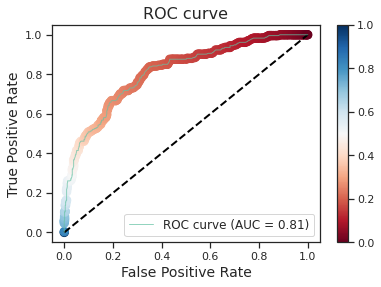

In [ ]:
# best random forest w/ tuned parameters from training)


best_rf_model = RandomForestClassifier(max_features = 'sqrt', n_estimators = 1000)
best_rf_model.fit(X_train, Y_train) 
Y_prob_rf = best_rf_model.predict_proba(X_test)[:, 1]

final_results(best_rf_model)

cf_matrix(best_rf_model, 0.5)

plot_roc_curve(Y_test, Y_prob_rf, show_thresholds=True)

In [ ]:
#what happens if we increase the sensitivity of the classifer (i.e. decrease the probability threshold for the positive class)?

cf_matrix(best_rf_model, 0.35)


Confusion Matrix on Test Set with Threshold = 0.35

                 Actual: Hi Profit  Actual: Not
Pred: Hi Profit                119           81
Pred: Not                      115          646



Accuracy on Training Set = 1.0000
Cross Validated Training Accuracy: 0.800 +/- 0.005
Cross Validated Training AUC 0.8187


Accuracy on Test Set = 0.8033

Classification Report on Test Set
              precision    recall  f1-score   support

           0       0.83      0.93      0.88       727
           1       0.66      0.40      0.50       234

    accuracy                           0.80       961
   macro avg       0.74      0.67      0.69       961
weighted avg       0.79      0.80      0.78       961



Confusion Matrix on Test Set with Threshold = 0.5

                 Actual: Hi Profit  Actual: Not
Pred: Hi Profit                 93           48
Pred: Not                      141          679





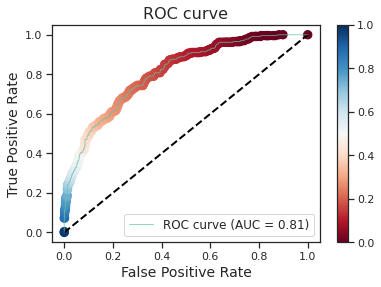

In [ ]:
# best bagged decision trees w/ tuned parameters (from training)

best_bgt_model = BaggingClassifier(n_estimators = 1000)
best_bgt_model.fit(X_train, Y_train) 
Y_prob_bgt = best_bgt_model.predict_proba(X_test)[:, 1]

final_results(best_bgt_model)

cf_matrix(best_bgt_model, 0.5)

plot_roc_curve(Y_test, Y_prob_bgt, show_thresholds=True)

In [ ]:
#what happens if we increase the sensitivity of the classifer (i.e. decrease the probability threshold for the positive class)?

cf_matrix(best_bgt_model, 0.35)


Confusion Matrix on Test Set with Threshold = 0.35

                 Actual: Hi Profit  Actual: Not
Pred: Hi Profit                127           97
Pred: Not                      107          630



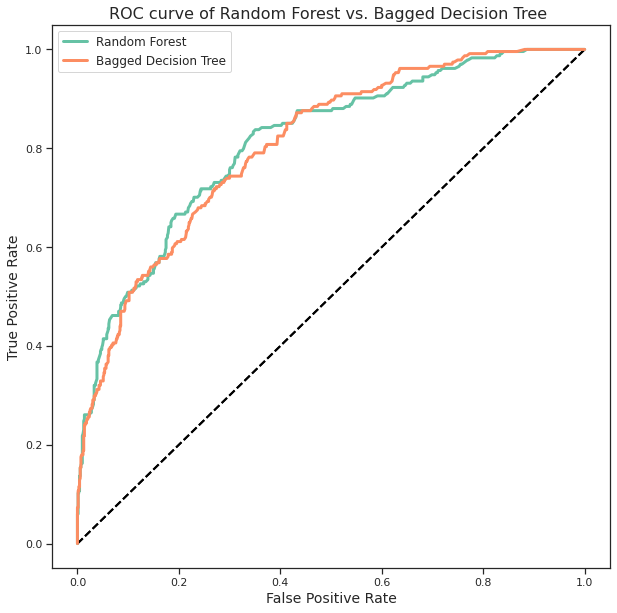

In [ ]:
# plot ROC curves for 2 best tuned classifiers

plt.figure(figsize=(10, 10))

plot_roc_curves(Y_test, [Y_prob_rf, Y_prob_bgt], 
                labels=["Random Forest", "Bagged Decision Tree"],
                title="ROC curve of Random Forest vs. Bagged Decision Tree ",
                show_thresholds=False)


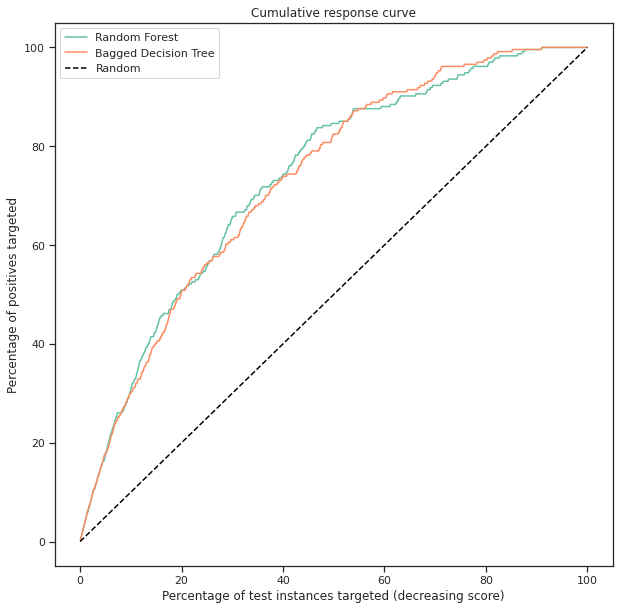

In [ ]:
models = {"Random Forest": best_rf_model, "Bagged Decision Tree": best_bgt_model}
Y_probs = {"Random Forest": Y_prob_rf, "Bagged Decision Tree": Y_prob_bgt}
plt.figure(figsize=(10, 10))
plot_cumulative_curve(models, Y_probs)

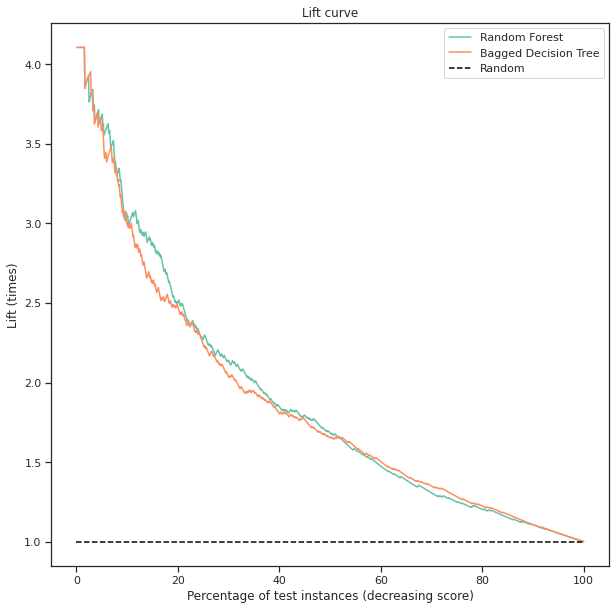

In [ ]:
plt.figure(figsize=(10, 10))
plot_lift_curve(models, Y_probs)


In [ ]:
# Construct profit curves 

# What's the the average budget for all movies in the data set?

round(df_merged.budget_adj.mean(),0)

49505752.0

In [ ]:
# and the average revenue for all movies in the data set?


round(df_merged.revenue_adj.mean(),0)

149825305.0

In [ ]:
# Let's construct a cost matrix.    We know every movie has a unique cost to make (budget) and the ultiamte profit (eventual total revenue - budget) is unknown 
#  so how to estimate expected value?   Let's use average budgets and average revenues across all movies in the dataset to estimate:

# from above:
unit_cost = 49505752        
unit_revenue = 149825305     

# and of course if we pass on a movie we incur no costs, but generate no profits

# This gives us a cost matrix of:

cost_matrix = pd.DataFrame([[unit_revenue - unit_cost, - unit_cost], [0, 0]], columns=['p', 'n'], index=['Y', 'N'])
print ("Cost matrix")
print (cost_matrix)

# note this is not strictly real-life accurate, as our data shows that on average even movies in our Class = 0 make some profit (this is the drawback of the binary classification approach on this problem)
# but since in the real world we would only have a limited budget to invest and would have the risk of going bankrupt if too many of our False Positives turned out to the money-losing kind, as opposed to
# the ones that just made a bit of money, setting up the expected value analysis this way should be more useful to the end user

Cost matrix
           p         n
Y  100319553 -49505752
N          0         0


In [ ]:
unit_cost = -cost_matrix['n']['Y']
unit_revenue = cost_matrix['p']['Y'] + unit_cost

import matplotlib.pyplot as plt 

def plot_profit_curve(models, Y_probs):
    # Plot curve for each model
    total_obs = len(Y_test)
    total_pos = Y_test.sum()
    for key in models:
        X_cumulative, Y_cumulative = build_cumulative_curve(models[key], Y_probs[key], scale=1)
        profits = unit_revenue * Y_cumulative * total_pos - unit_cost * X_cumulative * total_obs
        #plt.plot(X_cumulative*100, profits, label=key)
        plt.plot(X_cumulative, profits, label=key)
    # Plot other details
    plt.xlabel("Percentage of Movie Slate Greenlit (Descending Order of Prob)")
    plt.ylabel("Profit")
    plt.title("Profit Curve")
    plt.legend()
    


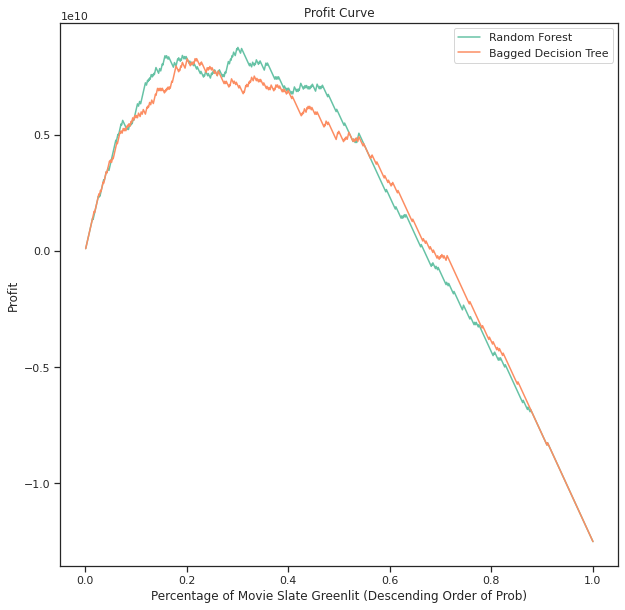

In [ ]:
plt.figure(figsize=(10, 10))
plot_profit_curve(models, Y_probs)

Funding the top 15% of movies we see, as ranked by our tuned RF binary classifier, would result in optimal expected return on investment (total expected profit / total expected investment).   Funding the top 35% of movies would result in slightly higher total profit, but at a cost of significantly higher capital required for investment

### Multi-class Classifcation



####Simple Classifiers

In [ ]:
#Let's evaluate some models on the multi-class problem.

#simple decision tree 

clf_dt_mc = DecisionTreeClassifier()
clf_dt_mc.fit(x_train, y_train)

mc_results(clf_dt_mc)

#Accuracy on Training Set = 1.0000
#Cross Validated Training Accuracy: 0.451 +/- 0.008



Accuracy on Training Set = 1.0000
Cross Validated Training Accuracy: 0.446 +/- 0.012

              precision    recall  f1-score   support

         Hit       1.00      1.00      1.00       947
     Neutral       1.00      1.00      1.00      2193
        Loss       1.00      1.00      1.00       702

    accuracy                           1.00      3842
   macro avg       1.00      1.00      1.00      3842
weighted avg       1.00      1.00      1.00      3842



In [ ]:
#decision tree with complexity control

depth = [1,2,4,6,8,10,15,25,50]

for d in depth:
  clf_dt_mc = DecisionTreeClassifier(max_depth = d)
  clf_dt_mc.fit(x_train, y_train)
  print("Max Depth", d)
  mc_results(clf_dt_mc)

 
#  Max Depth 10
#Accuracy on Training Set = 0.6918
#Cross Validated Training Accuracy: 0.523 +/- 0.005


Max Depth 1
Accuracy on Training Set = 0.5708
Cross Validated Training Accuracy: 0.571 +/- 0.000

              precision    recall  f1-score   support

         Hit       0.00      0.00      0.00       947
     Neutral       0.57      1.00      0.73      2193
        Loss       0.00      0.00      0.00       702

    accuracy                           0.57      3842
   macro avg       0.19      0.33      0.24      3842
weighted avg       0.33      0.57      0.41      3842

Max Depth 2
Accuracy on Training Set = 0.5708


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross Validated Training Accuracy: 0.571 +/- 0.000

              precision    recall  f1-score   support

         Hit       0.00      0.00      0.00       947
     Neutral       0.57      1.00      0.73      2193
        Loss       0.00      0.00      0.00       702

    accuracy                           0.57      3842
   macro avg       0.19      0.33      0.24      3842
weighted avg       0.33      0.57      0.41      3842

Max Depth 4
Accuracy on Training Set = 0.5742
Cross Validated Training Accuracy: 0.562 +/- 0.007

              precision    recall  f1-score   support

         Hit       0.79      0.01      0.02       947
     Neutral       0.57      1.00      0.73      2193
        Loss       0.55      0.01      0.02       702

    accuracy                           0.57      3842
   macro avg       0.63      0.34      0.26      3842
weighted avg       0.62      0.57      0.42      3842

Max Depth 6
Accuracy on Training Set = 0.5955
Cross Validated Training Accuracy: 0.550 +

In [ ]:
# basic logistic regression

c_values = [1000, 100, 10, 1.0, 0.1, 0.01]

for c in c_values:
  clf_lr_mc = LogisticRegression(max_iter=1000, C=c)
  clf_lr_mc.fit(x_train, y_train) 
  print("C =", c)
  mc_results(clf_lr_mc)

#C = 100
#Accuracy on Training Set = 0.6049
#Cross Validated Training Accuracy: 0.513 +/- 0.008

C = 1000
Accuracy on Training Set = 0.6046
Cross Validated Training Accuracy: 0.514 +/- 0.008

              precision    recall  f1-score   support

         Hit       0.56      0.22      0.31       947
     Neutral       0.61      0.92      0.74      2193
        Loss       0.53      0.13      0.21       702

    accuracy                           0.60      3842
   macro avg       0.57      0.42      0.42      3842
weighted avg       0.59      0.60      0.54      3842

C = 100
Accuracy on Training Set = 0.6049
Cross Validated Training Accuracy: 0.513 +/- 0.008

              precision    recall  f1-score   support

         Hit       0.57      0.22      0.32       947
     Neutral       0.61      0.92      0.74      2193
        Loss       0.53      0.13      0.21       702

    accuracy                           0.60      3842
   macro avg       0.57      0.42      0.42      3842
weighted avg       0.59      0.60      0.54      3842

C = 10
Accuracy on Training Set = 0.6046
Cross Va

In [ ]:
# knn
neighbors = [5,10,20,50,100,200,500]

for n in neighbors:
  clf_knn_mc = KNeighborsClassifier(n_neighbors=n)
  clf_knn_mc.fit(x_train, y_train) 
  print("K =", n)
  mc_results(clf_knn_mc)


#K = 5
#Accuracy on Training Set = 0.6340
#Cross Validated Training Accuracy: 0.477 +/- 0.005


K = 5
Accuracy on Training Set = 0.6340
Cross Validated Training Accuracy: 0.477 +/- 0.005

              precision    recall  f1-score   support

         Hit       0.54      0.47      0.50       947
     Neutral       0.67      0.86      0.75      2193
        Loss       0.53      0.16      0.25       702

    accuracy                           0.63      3842
   macro avg       0.58      0.50      0.50      3842
weighted avg       0.61      0.63      0.60      3842

K = 10
Accuracy on Training Set = 0.5940
Cross Validated Training Accuracy: 0.507 +/- 0.013

              precision    recall  f1-score   support

         Hit       0.49      0.28      0.36       947
     Neutral       0.62      0.89      0.73      2193
        Loss       0.46      0.08      0.14       702

    accuracy                           0.59      3842
   macro avg       0.52      0.42      0.41      3842
weighted avg       0.56      0.59      0.53      3842

K = 20
Accuracy on Training Set = 0.5796
Cross Valida

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy on Training Set = 0.5708
Cross Validated Training Accuracy: 0.571 +/- 0.000

              precision    recall  f1-score   support

         Hit       0.00      0.00      0.00       947
     Neutral       0.57      1.00      0.73      2193
        Loss       0.00      0.00      0.00       702

    accuracy                           0.57      3842
   macro avg       0.19      0.33      0.24      3842
weighted avg       0.33      0.57      0.41      3842

K = 200


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy on Training Set = 0.5708
Cross Validated Training Accuracy: 0.571 +/- 0.000

              precision    recall  f1-score   support

         Hit       0.00      0.00      0.00       947
     Neutral       0.57      1.00      0.73      2193
        Loss       0.00      0.00      0.00       702

    accuracy                           0.57      3842
   macro avg       0.19      0.33      0.24      3842
weighted avg       0.33      0.57      0.41      3842

K = 500


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy on Training Set = 0.5708
Cross Validated Training Accuracy: 0.571 +/- 0.000

              precision    recall  f1-score   support

         Hit       0.00      0.00      0.00       947
     Neutral       0.57      1.00      0.73      2193
        Loss       0.00      0.00      0.00       702

    accuracy                           0.57      3842
   macro avg       0.19      0.33      0.24      3842
weighted avg       0.33      0.57      0.41      3842



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Advanced Classifiers


In [ ]:
# the results above are ok but not great - do more complex models work better?

# bagged decision trees with hyperparameter grid search

# define models and parameters
model = BaggingClassifier()
n_estimators = [10, 100, 1000, 5000]
# define grid search
grid = dict(n_estimators=n_estimators)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Best: 0.553360 using {'n_estimators': 5000}

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.553360 using {'n_estimators': 5000}
0.518308 (0.019143) with: {'n_estimators': 10}
0.550236 (0.016376) with: {'n_estimators': 100}
0.552405 (0.011145) with: {'n_estimators': 1000}
0.553360 (0.012558) with: {'n_estimators': 5000}


In [ ]:
# random forest w/ grid search for hyper-parameters

# define models and parameters
model = RandomForestClassifier()
n_estimators = [10, 100, 1000, 5000]
max_features = ['sqrt', 'log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))


# Best: 0.565937 using {'max_features': 'log2', 'n_estimators': 5000}

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Best: 0.565937 using {'max_features': 'log2', 'n_estimators': 5000}
0.509449 (0.021158) with: {'max_features': 'sqrt', 'n_estimators': 10}
0.561514 (0.008751) with: {'max_features': 'sqrt', 'n_estimators': 100}
0.562643 (0.007914) with: {'max_features': 'sqrt', 'n_estimators': 1000}
0.564204 (0.007360) with: {'max_features': 'sqrt', 'n_estimators': 5000}
0.510324 (0.021093) with: {'max_features': 'log2', 'n_estimators': 10}
0.560558 (0.008982) with: {'max_features': 'log2', 'n_estimators': 100}
0.565244 (0.006331) with: {'max_features': 'log2', 'n_estimators': 1000}
0.565937 (0.007556) with: {'max_features': 'log2', 'n_estimators': 5000}


In [ ]:
# logistic regression w/ grid search for hyper-parameters


# define models and parameters
model = LogisticRegression(max_iter=200)#, class_weight='balanced')  
solvers = ['newton-cg', 'lbfgs', 'liblinear','saga']
penalty = ['l1','l2','elasticnet','none']  
c_values = [10, 1.0, 0.1, 0.01, 0.001]   

# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1_micro',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

#Best: 0.570796 using {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}




Best: 0.570796 using {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'l1', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'l1', 'solver': 'lbfgs'}
0.520646 (0.013045) with: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
0.517523 (0.013614) with: {'C': 10, 'penalty': 'l1', 'solver': 'saga'}
0.516396 (0.012090) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.516309 (0.011941) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.520126 (0.012357) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.517436 (0.013081) with: {'C': 10, 'penalty': 'l2', 'solver': 'saga'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'elasticnet', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'elasticnet', 'solver': 'lbfgs'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'elasticnet', 'solver': 'liblinear'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'elasticnet', 'solver': 'saga'}
0.515962 (

#### Model Evaluation


In [ ]:
# let's evaulate our best 2 models (selected via cross-validated accuracy from the training stage)

#create evaluation functions

#with help from: https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html

def mc_final_results(model, y_prob):
  print ( "Accuracy on Training Set = %.4f" % accuracy_score(model.predict(x_train), y_train) )
  scores = cross_val_score(model, x_train, y_train, scoring="accuracy", cv=5)
  print ("Cross Validated Training Accuracy: %0.3f +/- %0.3f" % (scores.mean(), scores.std()))
  print("")
  print("")
  print ( "Accuracy on Test Set = %.4f" % accuracy_score(model.predict(x_test), y_test) )
  print("")
#  macro_roc_auc_ovo = roc_auc_score(y_test, y_prob, multi_class="ovo",
#                                  average="macro")
#  weighted_roc_auc_ovo = roc_auc_score(y_test, y_prob, multi_class="ovo",
#                                     average="weighted")
#  macro_roc_auc_ovr = roc_auc_score(y_test, y_prob, multi_class="ovr",
#                                  average="macro")
#  weighted_roc_auc_ovr = roc_auc_score(y_test, y_prob, multi_class="ovr",
#                                     average="weighted")
#  print("One-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
#      "(weighted by prevalence)"
#      .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
#  print("")
#  print("One-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
#      "(weighted by prevalence)"
#      .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))
  print("")
  y_preds_test = model.predict(x_test)
  print("Classification Report on Test Set")
  print(classification_report(y_test, y_preds_test, target_names=cat_names))
  print("")

In [ ]:
tick_labels = [c[:3] for c in cat_names]
def plot_matrix(mat, title, remove_diagonal=True):
    error_mat = mat.copy()
    if remove_diagonal:
        diag_ixs = np.arange(mat.shape[0])
        error_mat[diag_ixs, diag_ixs] = 0
        plt.figure(figsize=(3,3))
    sns.heatmap(error_mat, annot=True, fmt='d', yticklabels=tick_labels, xticklabels=tick_labels, linewidths=.5, square=True, cmap='coolwarm')
    plt.ylabel('Predictions')
    plt.xlabel('True labels')
    plt.title(title)

In [ ]:
#1)  Logistic Regression - using hyperparameters from rom training evaluation

best_lr_mc_model = LogisticRegression(max_iter=500,C=0.001, multi_class='multinomial', penalty='l2',solver='lbfgs')
best_lr_mc_model.fit(x_train, y_train) 
y_prob_lr_mc = best_lr_mc_model.predict_proba(x_test)[:, 1]
y_preds_lr_mc = best_lr_mc_model.predict(x_test)



In [ ]:
mc_final_results(best_lr_mc_model,y_prob_lr_mc)

#the model is v poor at identifying the "loss" class - no movies were classified as losses!

Accuracy on Training Set = 0.5893
Cross Validated Training Accuracy: 0.565 +/- 0.009


Accuracy on Test Set = 0.5297


Classification Report on Test Set
              precision    recall  f1-score   support

         Hit       0.73      0.03      0.06       727
     Neutral       0.24      0.95      0.38       234
        Loss       0.00      0.00      0.00         0

    accuracy                           0.25       961
   macro avg       0.32      0.33      0.15       961
weighted avg       0.61      0.25      0.14       961




/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


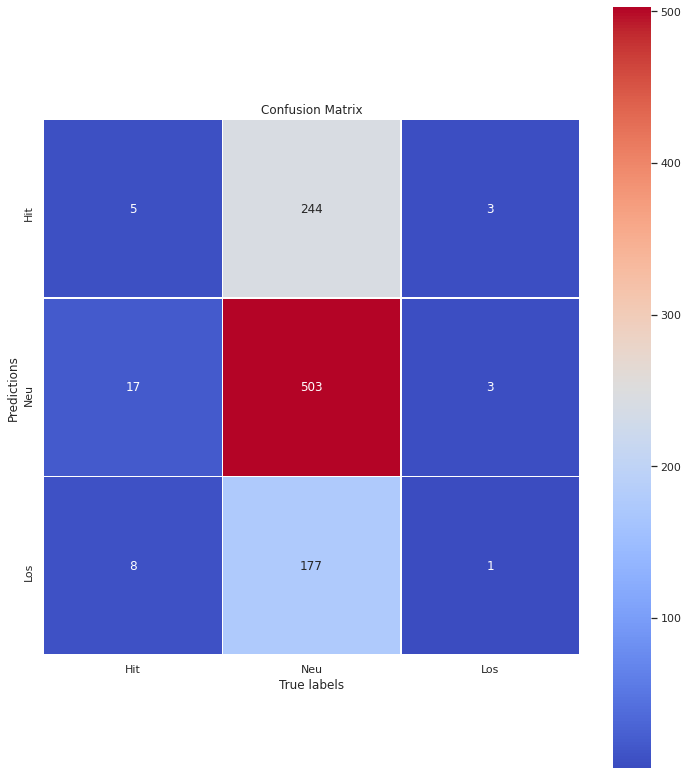

In [ ]:
cf_matrix_lr_mc = confusion_matrix(y_test, y_preds_lr_mc)
#print(cf_matrix)
plot_matrix(cf_matrix_lr_mc, 'Confusion Matrix', remove_diagonal=False)

In [ ]:
#2)  Random Forest - from training: 0.565937 using {'max_features': 'log2', 'n_estimators': 5000}

best_rf_mc_model = RandomForestClassifier(max_features='log2', n_estimators=5000)
best_rf_mc_model.fit(x_train, y_train) 
y_prob_rf_mc = best_rf_mc_model.predict_proba(x_test)[:, 1]
y_preds_rf_mc = best_rf_mc_model.predict(x_test)



In [ ]:
mc_final_results(best_rf_mc_model, y_prob_rf_mc)

Accuracy on Training Set = 1.0000
Cross Validated Training Accuracy: 0.564 +/- 0.005


Accuracy on Test Set = 0.5390


Classification Report on Test Set
              precision    recall  f1-score   support

         Hit       0.86      0.02      0.03       727
     Neutral       0.24      0.98      0.39       234
        Loss       0.00      0.00      0.00         0

    accuracy                           0.25       961
   macro avg       0.37      0.33      0.14       961
weighted avg       0.71      0.25      0.12       961




/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


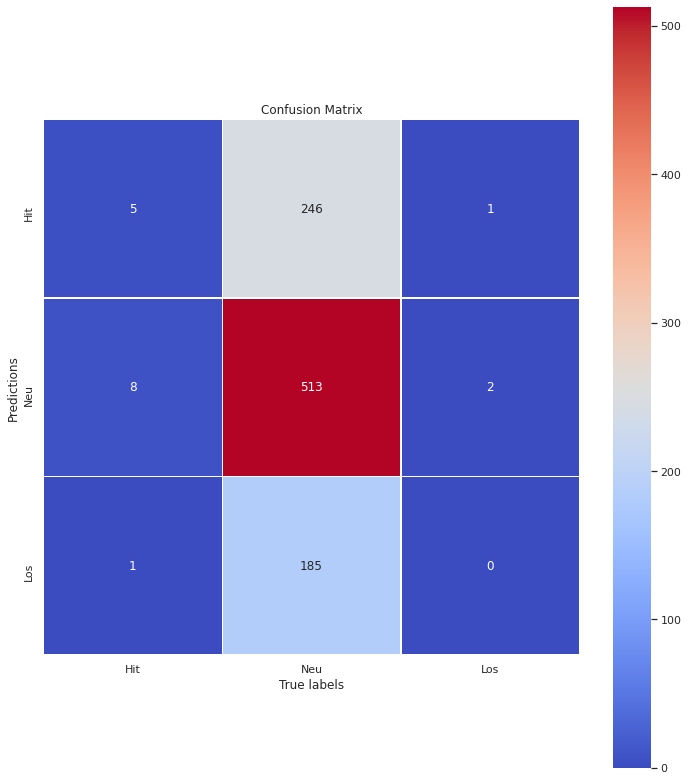

In [ ]:
cf_matrix_rf_mc = confusion_matrix(y_test, y_preds_rf_mc)
#print(cf_matrix)
plot_matrix(cf_matrix_rf_mc, 'Confusion Matrix', remove_diagonal=False)

Overall model performance on the multi-class classification problem is clearly weak, and so hte model is unlikely to be useful to the business.   We will use the binary classifer in our final report.   

#Feature Importance

In [ ]:

# Feature Importance with Extra Trees Classifier

#with help from: https://www.geeksforgeeks.org/ml-extra-tree-classifier-for-feature-selection/ and https://machinelearningmastery.com/feature-selection-machine-learning-python/


from sklearn.ensemble import ExtraTreesClassifier

# feature extraction
model = ExtraTreesClassifier(n_estimators=100, criterion='entropy', max_depth=10)
model.fit(X, Y)
 

feat_imp_dict = dict(zip(predictor_columns, model.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp.sort_values(by=['FeatureImportance'], ascending=False).head(25)

# This visualisation of feature importance would be useful in terms of expalining our model to business users: it's clear that features that one would intuitively expect to be correlated with profitability actually are.  So although we are
# using a complex tree-based model that will be difficult for the layperson to understand, this should help with explainability and buy-in.   Everything here makse sense - these are things we would naturally associate with profitability,
# and are quite possible already heuristics used by decision-makers in the industry (e.g. horror movies tend to be profitable because they are cheap to make, and enduringly popular with customers)


,FeatureImportance
budget_adj,0.105716
age,0.063886
genre_Horror,0.044325
stud_Unknown,0.032331
high_rev_month,0.027915
producer_avg_prior_prof,0.024505
stud_United Artists,0.020013
genre_Action,0.018841
genre_avg_prior_rev,0.018130
genre_avg_prior_prof,0.017880


In [ ]:
feat_imp.sort_values(by=['FeatureImportance'], ascending=False).tail(20)

# similarly for the features that are least likely to be associated with profitability: "niche" keywords such "baby", "africa" - this is as expected - "fbi", "police", "alien" etc. are more surprising.   
# Certain studios clearly have a bad track record of profitability and should be avoided as investments!

,FeatureImportance
genre_Other,0.000037
stud_Intermedia Films,0.000034
kw_beach,0.000027
stud_Plan B Entertainment,0.000024
stud_Vertigo Entertainment,0.000023
kw_white house,0.000021
kw_fbi,0.000019
kw_baby,0.000016
kw_africa,0.000010
stud_Artisan Entertainment,0.000009


In [ ]:
# Examine Feature importance with RFE

from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# feature extraction
model = LogisticRegression(C=0.1, penalty='l1',solver='liblinear')    #uses hyperparameters tuned above
rfe = RFE(model, 25)
fit = rfe.fit(X, Y)
#print("Num Features: %d" % fit.n_features_)
#print("Selected Features: %s" % fit.support_)
#print("Feature Ranking: %s" % fit.ranking_)

rfe_feat_imp_dict = dict(zip(predictor_columns, fit.ranking_))
rfe_feat_imp = pd.DataFrame.from_dict(rfe_feat_imp_dict, orient='index')
rfe_feat_imp.rename(columns = {0:'FeatureRanking'}, inplace = True)
rfe_feat_imp.sort_values(by=['FeatureRanking'], ascending=True).head(30)

#RFE results show a different view of the features most strongly associated with profitability: a number of inutitive popular genres  feature strongly - this makes sense.
# as do measures of cast, producer, studio and director historical financial success, as well as budgets - again this confirms what we would intuitively suspect.    Certain studios - and languages - are strongly associated with profitability also.

,FeatureRanking
age,1
genre_Adventure,1
genre_Comedy,1
genre_Drama,1
genre_Horror,1
pc_Germany,1
pc_Other,1
pc_United States of America,1
kw_Unknown,1
stud_Unknown,1


In [ ]:
#let's look at a longer ranking of features using RFQ


# feature extraction
model = LogisticRegression(solver='lbfgs', max_iter=500)
rfe = RFE(model, 10)
fit = rfe.fit(X, Y)
#print("Num Features: %d" % fit.n_features_)
#print("Selected Features: %s" % fit.support_)
#print("Feature Ranking: %s" % fit.ranking_)

rfe_feat_imp_dict = dict(zip(predictor_columns, fit.ranking_))
rfe_feat_imp = pd.DataFrame.from_dict(rfe_feat_imp_dict, orient='index')
rfe_feat_imp.rename(columns = {0:'FeatureRanking'}, inplace = True)
rfe_feat_imp.sort_values(by=['FeatureRanking'], ascending=True).head(30)

#this is a pretty good cheatsheet for movie investment

,FeatureRanking
age,1
kw_dc comics,1
kw_flying,1
stud_DreamWorks Animation,1
stud_Marvel Studios,1
studio1_avg_prior_prof,1
producer_avg_prior_prof,1
stud_Blumhouse Productions,1
director_avg_prior_prof,1
budget_adj,1


In [ ]:
# visualise our random forest model

#with help from: https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

# Extract single tree
estimator = best_rf_model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = predictor_columns,
                class_names = ['0','1'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')


# n.b. because we're visualising a random forest tree the splits will change slightly each time, but this is an interesting visualisation of how the model breaks down the data set!

In [ ]:
# too much info!    let's look at a simplified tree to get a flavour (n.b. it's a random forest so will look diferent each time!)

model = RandomForestClassifier(max_depth = 5, n_estimators=1000)
model.fit(X_train, Y_train)
estimator_limited = model.estimators_[5]
estimator_limited

export_graphviz(estimator_limited, out_file='tree_limited.dot', feature_names = predictor_columns,
                class_names = ['0', '1'],
                rounded = True, proportion = False, precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree_limited.dot', '-o', 'tree_limited.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree_limited.png')


# this is super interesting:  as expected many of the most importance features (e.g. historical revenue performance of the cast, 
# whether the year was a paticularly revenue-generating one for movies overall, director historical revenue etc.) all feature as important
# splits.  Unusual that production company = Australia or not is at the top!

In [ ]:
#what if we don't use a random forest but the simple decision tree with the parameters we found worked "ok" earlier

from sklearn.tree import export_graphviz

export_graphviz(model, out_file='tree_dt.dot', feature_names = predictor_columns,
                class_names = ['0', '1'],
                rounded = True, proportion = False, precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree_dt.dot', '-o', 'tree_dt.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree_dt.png')

#as above this appears largely as expected in terms of feature importance and would make sense to a business user looking to understand the tree model: it shows that the proposed move budget (smaller being better), 
# producer profitability track record (higher being better), studio profitability track record (again higher is better), and the director's history of making high revenue movies are all important for being classified as "1".
# Interestingly Age appears as a factor (remember we normalised all fields, so age <= 1.535 doesn't actually mean 1.5 years, but 1.5 standard deviations from the mean age) with older movies being penalised (i.e. more recent 
# movies are judged more likely to be profitable.

#EDA   




Exlore the data to help evaluate features and think about appropriate models to use

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


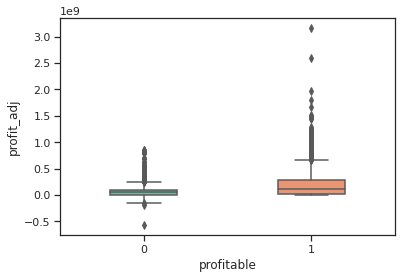

In [ ]:
import matplotlib as plt
import seaborn as sns
%matplotlib inline
sns.set(style='ticks', palette='Set2')


sns.boxplot("profitable", "profit_adj", width=0.4, data=df_merged)



In [ ]:
# look at feature correlation  (n.b. this takes a long time to run!)

sns.heatmap(data.corr(), annot=True, fmt='.1g', cmap='coolwarm', vmin=0, vmax=1, square=True)

#with help from https://heartbeat.fritz.ai/seaborn-heatmaps-13-ways-to-customize-correlation-matrix-visualizations-f1c49c816f07

In [ ]:
# studios

print('Number of studios in films')
df_merged['production_companies'].apply(lambda x: len(x) if x != {} else 0).value_counts()

Number of studios in films


1     1066
2     1062
3      916
4      587
0      351
5      321
6      218
7      118
8       61
9       46
10      16
11      12
16       6
12       5
14       4
17       4
13       3
15       2
19       1
21       1
18       1
26       1
25       1
Name: production_companies, dtype: int64

In [ ]:
# Genres

print('Number of genres in films')
df_merged['genres'].apply(lambda x: len(x) if x != {} else 0).value_counts()

Number of genres in films


3    1525
2    1490
1     900
4     636
5     224
0      28
Name: genres, dtype: int64

In [ ]:
list_of_genres = []
for g in df_merged['genres']:
  list_of_genres.append(g)

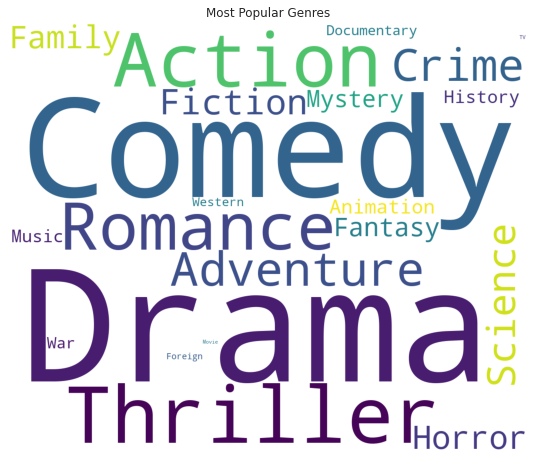

In [ ]:
from wordcloud import WordCloud

# with help from https://www.kaggle.com/artgor/eda-feature-engineering-and-model-interpretation

plt.figure(figsize = (12, 8))
text = ' '.join([i for j in list_of_genres for i in j])
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text)
plt.imshow(wordcloud)
plt.title('Most Popular Genres')
plt.axis("off")
plt.show()

In [ ]:
# keywords

list_of_keywords = []
for k in df_merged['keywords']:
  list_of_keywords.append(k)

In [ ]:
print('Number of Keywords in films')
df_merged['keywords'].apply(lambda x: len(x) if x != {} else 0).value_counts().head(10)

Number of Keywords in films


5    3089
0     412
4     387
3     344
1     288
2     283
Name: keywords, dtype: int64

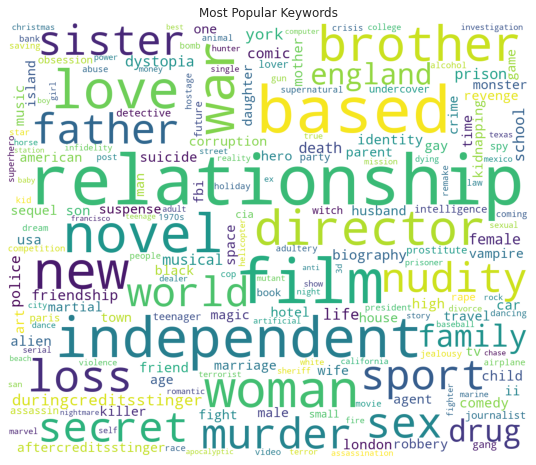

In [ ]:
plt.figure(figsize = (12, 8))
text = ' '.join([i for j in list_of_keywords for i in j])
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text)
plt.imshow(wordcloud)
plt.title('Most Popular Keywords')
plt.axis("off")
plt.show()

In [ ]:
print('Number of spoken languages in films')
df_merged['spoken_languages'].apply(lambda x: len(x) if x != {} else 0).value_counts()

Number of spoken languages in films


1    3355
2     841
3     308
4     133
0      86
5      80
Name: spoken_languages, dtype: int64

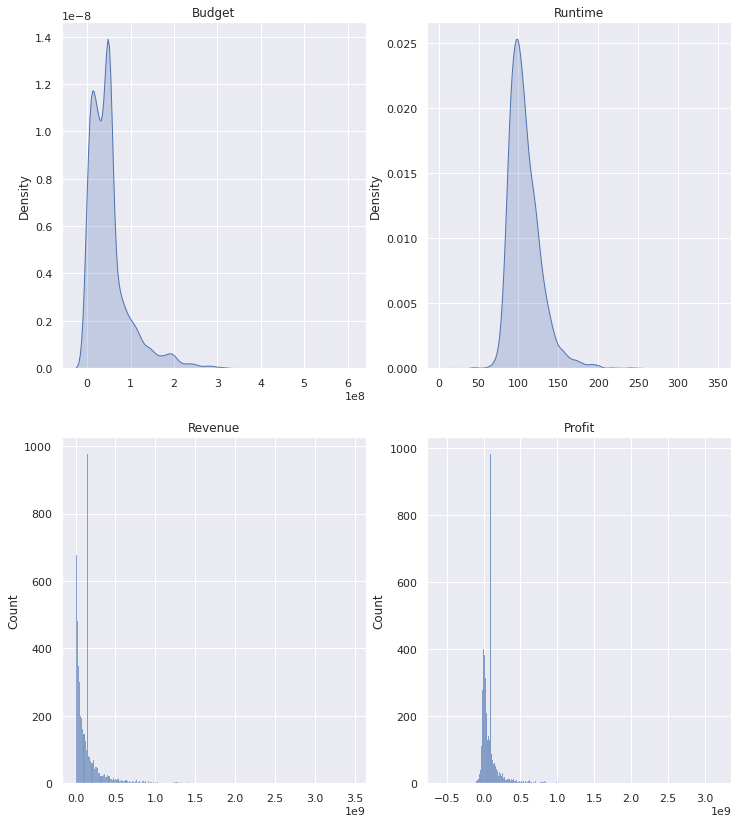

In [ ]:
#distribution of Budget, popularity, runtime and revenue
sns.set(rc={"figure.figsize": (12, 14)})
plt.subplot(2,2,1)
ax=sns.kdeplot(df_merged['budget_adj'].values, shade = True)
plt.title('Budget')
plt.subplot(2,2,2)
ax=sns.kdeplot(df_merged['runtime'].values, shade = True)
plt.title('Runtime')
plt.subplot(2,2,3)
ax=sns.histplot(df_merged['revenue_adj'].values)#, shade = True)
plt.title('Revenue')
plt.subplot(2,2,4)
ax=sns.histplot(df_merged['profit_adj'].values) #shade = True)
plt.title('Profit')

plt.show()

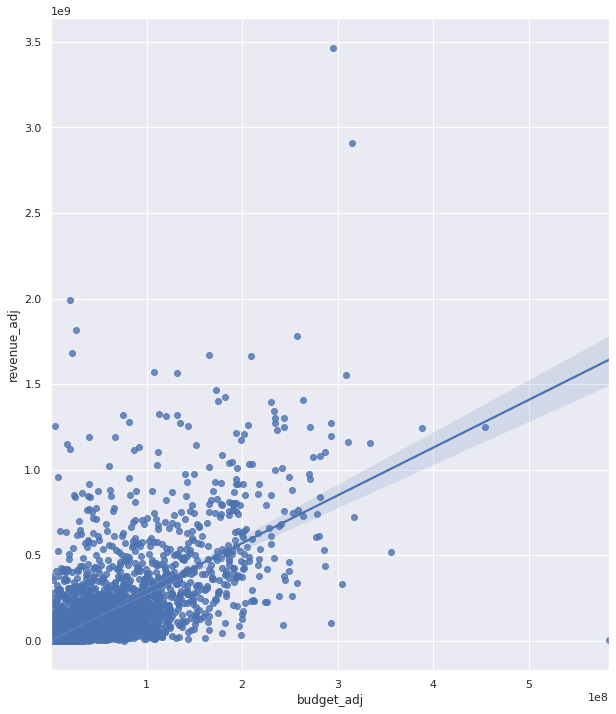

In [ ]:
# plot relationship between Budget and Revenue
f, ax = plt.subplots(figsize=(10, 12))
sns.regplot(x="budget_adj", y="revenue_adj", data=df_merged, ax=ax);

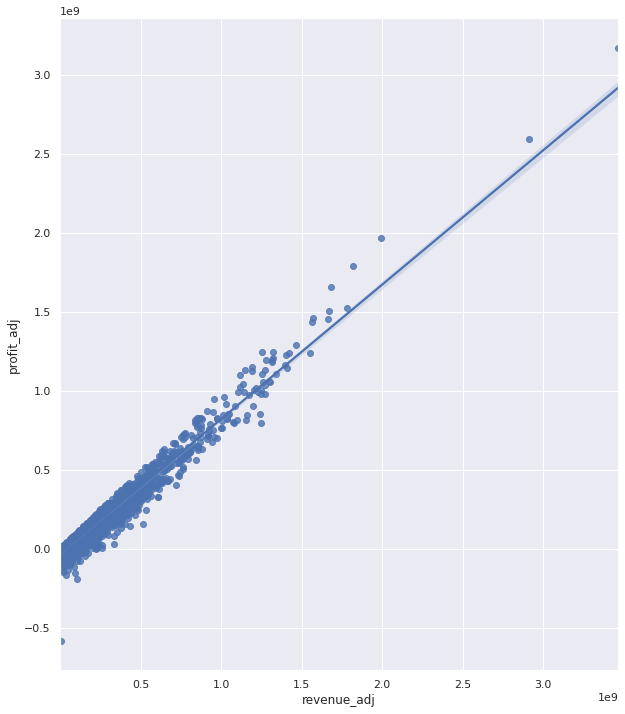

In [ ]:
# plot relationship between Revenue and Profit
f, ax = plt.subplots(figsize=(10, 12))
sns.regplot(x="revenue_adj", y="profit_adj", data=df_merged, ax=ax);

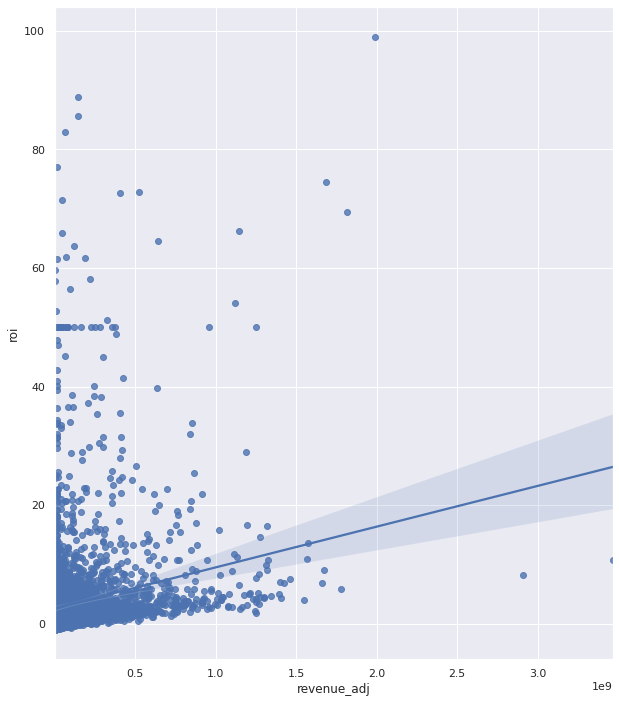

In [ ]:
# plot relationship between Budget and Profit
f, ax = plt.subplots(figsize=(10, 12))
sns.regplot(x="revenue_adj", y="roi", data=df_merged, ax=ax);

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


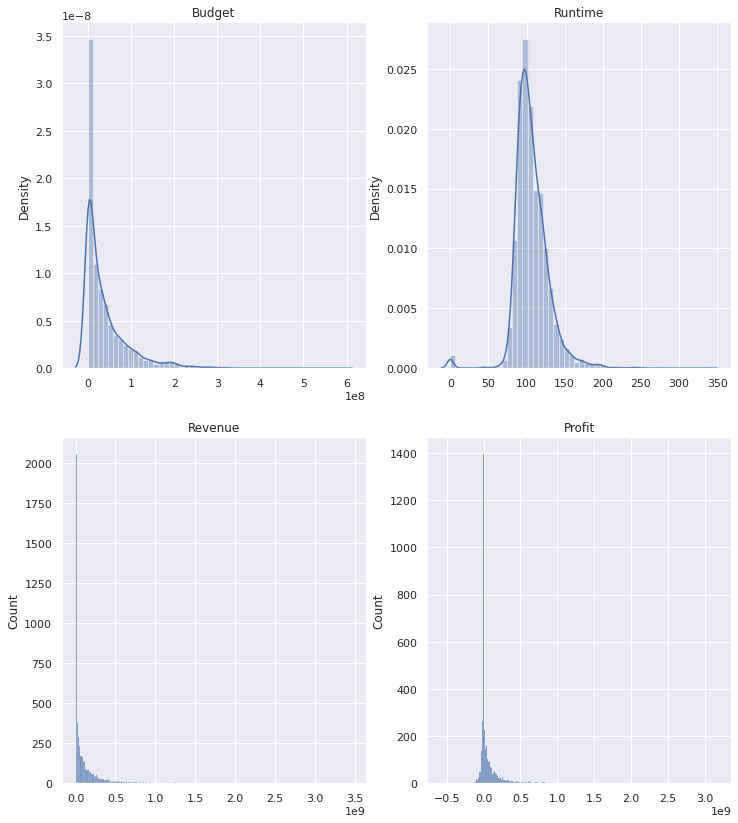

In [ ]:
#distribution of Budget, popularity, runtime and revenue

sns.set(rc={"figure.figsize": (12, 14)})
plt.subplot(2,2,1)
ax=sns.distplot(df_merged['budget_adj'].values)#, shade = True)
plt.title('Budget')
plt.subplot(2,2,2)
ax=sns.distplot(df_merged['runtime'].values)#, shade = True)
plt.title('Runtime')
plt.subplot(2,2,3)
ax=sns.histplot(df_merged['revenue_adj'].values)#, shade = True)
plt.title('Revenue')
plt.subplot(2,2,4)
ax=sns.histplot(df_merged['profit_adj'].values) #shade = True)
plt.title('Profit')

plt.show()

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0.5, 0, 'Log Profit')

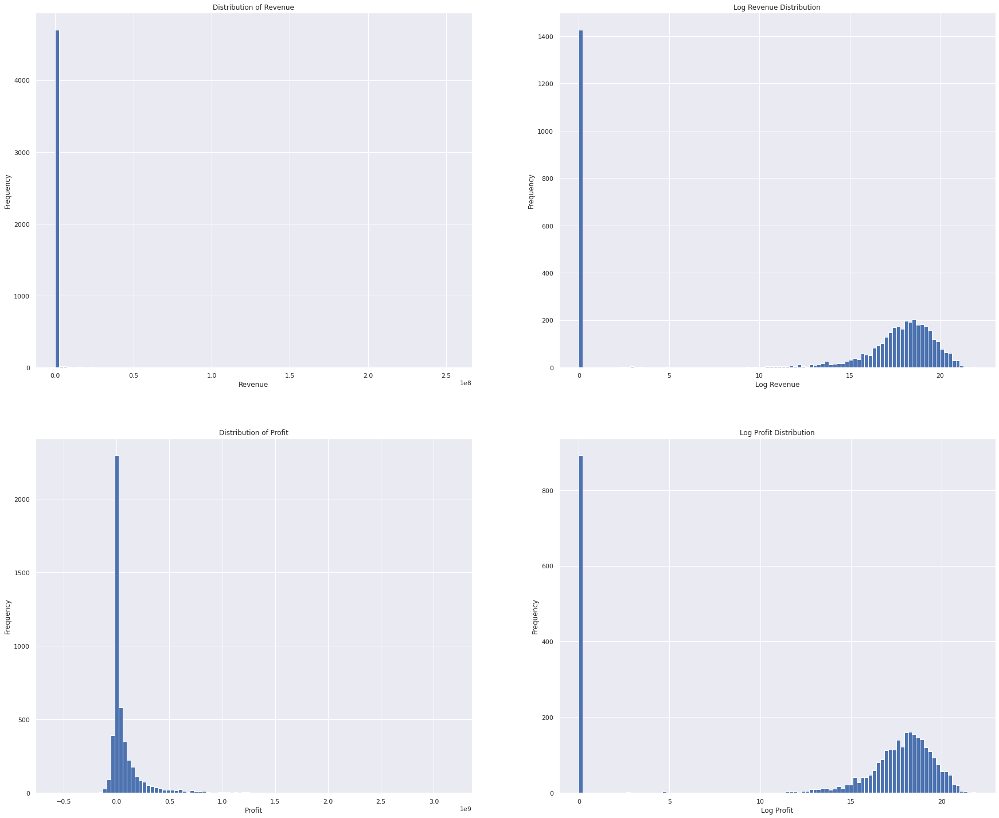

In [ ]:
# a different look at profit

fig = plt.figure(figsize=(30, 25))

plt.subplot(221)
df_merged['revenue_adj'].plot(kind='hist',bins=100)
plt.title('Distribution of Revenue')
plt.xlabel('Revenue')

plt.subplot(222)
np.log1p(df_merged['revenue_adj']).plot(kind='hist',bins=100)
plt.title('Log Revenue Distribution')
plt.xlabel('Log Revenue')

plt.subplot(223)
df_merged['profit_adj'].plot(kind='hist',bins=100)
plt.title('Distribution of Profit')
plt.xlabel('Profit')

plt.subplot(224)
np.log1p(df_merged['profit_adj']).plot(kind='hist',bins=100)
plt.title('Log Profit Distribution')
plt.xlabel('Log Profit')


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


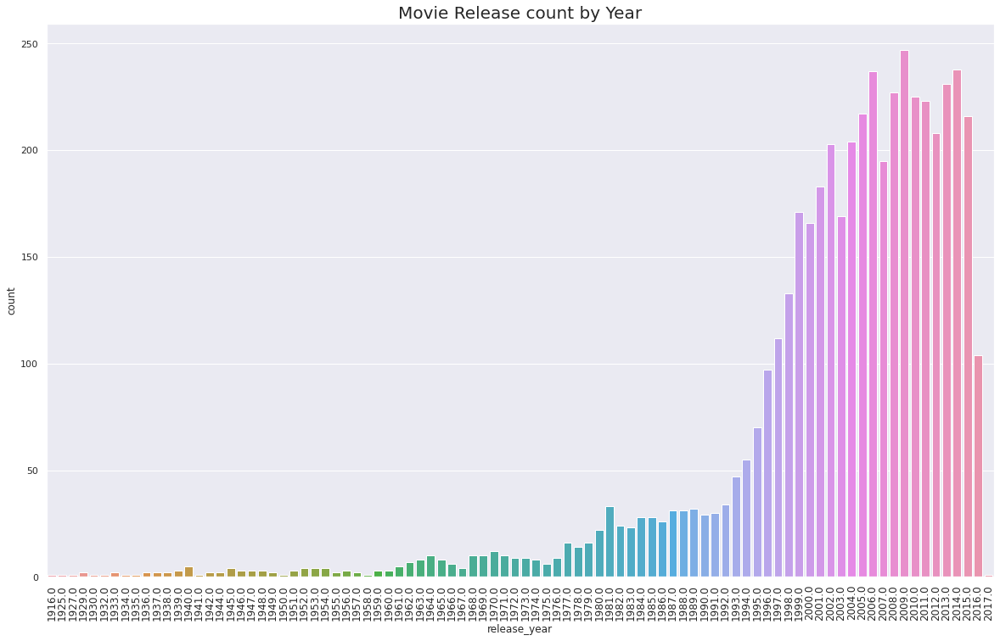

In [ ]:
# movie releases by year

plt.figure(figsize=(20,12))
sns.countplot(df_merged_old['release_year'].sort_values())
plt.title("Movie Release count by Year",fontsize=20)
loc, labels = plt.xticks()
plt.xticks(fontsize=12,rotation=90)
plt.show()

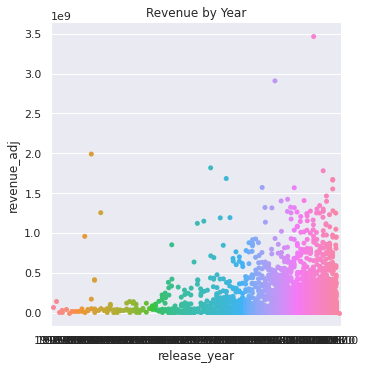

In [ ]:
# scatter of revenue by year 

sns.catplot(x='release_year', y='revenue_adj', data=df_merged_old);
plt.title('Revenue by Year');

In [ ]:
df_merged_old[['release_year', 'release_month']].groupby(['release_year'], as_index=False).count().sort_values(by='release_year', ascending=False)

,release_year,release_month
89,2017.0,1
88,2016.0,104
87,2015.0,216
86,2014.0,238
85,2013.0,231
...,...,...
4,1930.0,1
3,1929.0,2
2,1927.0,1
1,1925.0,1


Text(0, 0.5, 'Revenue')

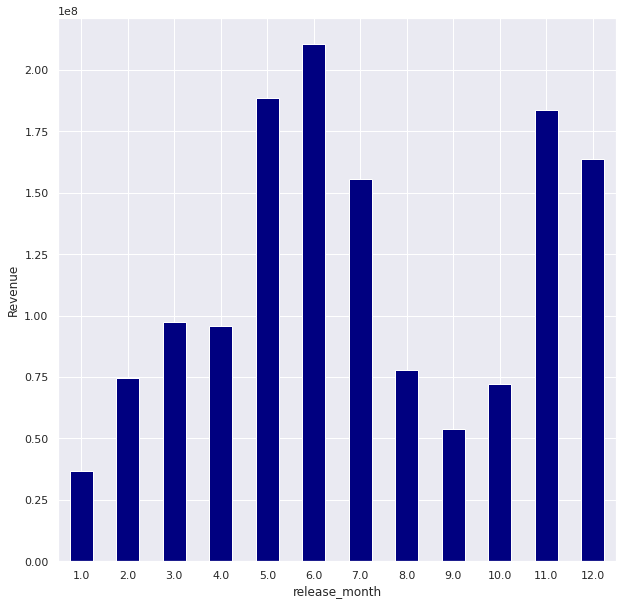

In [ ]:
# Average revenue by month

fig = plt.figure(figsize=(10,10))

df_merged_old.groupby('release_month').agg('mean')['revenue_adj'].plot(kind='bar',color='navy',rot=0)
plt.ylabel('Revenue')

In [ ]:
df_merged_old[['release_month', 'release_year']].groupby(['release_month'], as_index=False).count().sort_values(by='release_month', ascending=False)

,release_month,release_year
11,12.0,456
10,11.0,326
9,10.0,474
8,9.0,588
7,8.0,413
6,7.0,363
5,6.0,389
4,5.0,363
3,4.0,350
2,3.0,372


In [ ]:
df_merged_old[['release_year', 'revenue_adj']].groupby(['release_year'], as_index=False).mean().sort_values(by='release_year', ascending=False)

,release_year,revenue_adj
89,2017.0,0.000000e+00
88,2016.0,1.505117e+08
87,2015.0,1.164142e+08
86,2014.0,1.141327e+08
85,2013.0,1.164175e+08
...,...,...
4,1930.0,4.754507e+07
3,1929.0,1.320909e+07
2,1927.0,4.102147e+06
1,1925.0,1.443574e+08


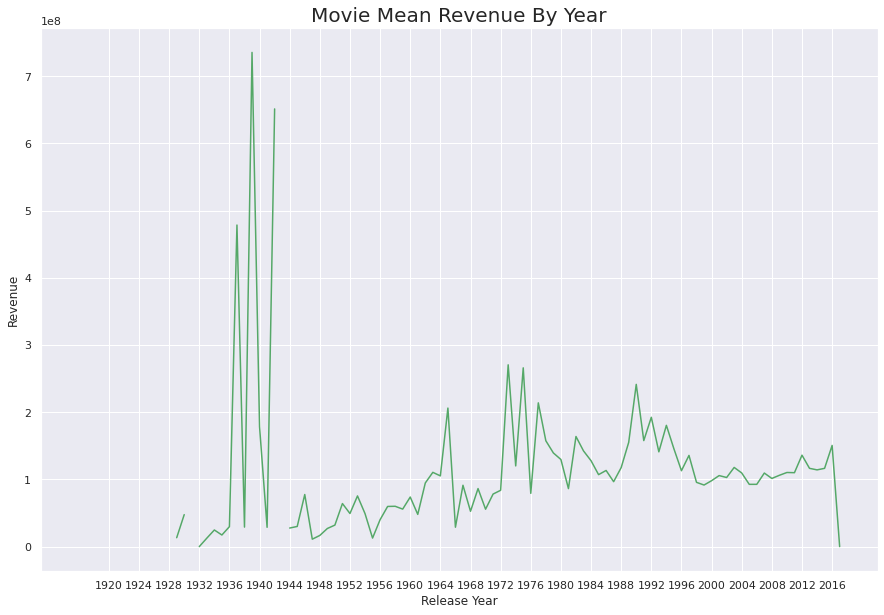

In [ ]:
# revenue by year 

df_merged_old['meanRevenueByYear'] = df_merged_old.groupby("release_year")["revenue_adj"].aggregate('mean')
df_merged_old['meanRevenueByYear'].plot(figsize=(15,10),color="g")
plt.xticks(np.arange(1920,2020,4))
plt.xlabel("Release Year")
plt.ylabel("Revenue")
plt.title("Movie Mean Revenue By Year",fontsize=20)
plt.show()

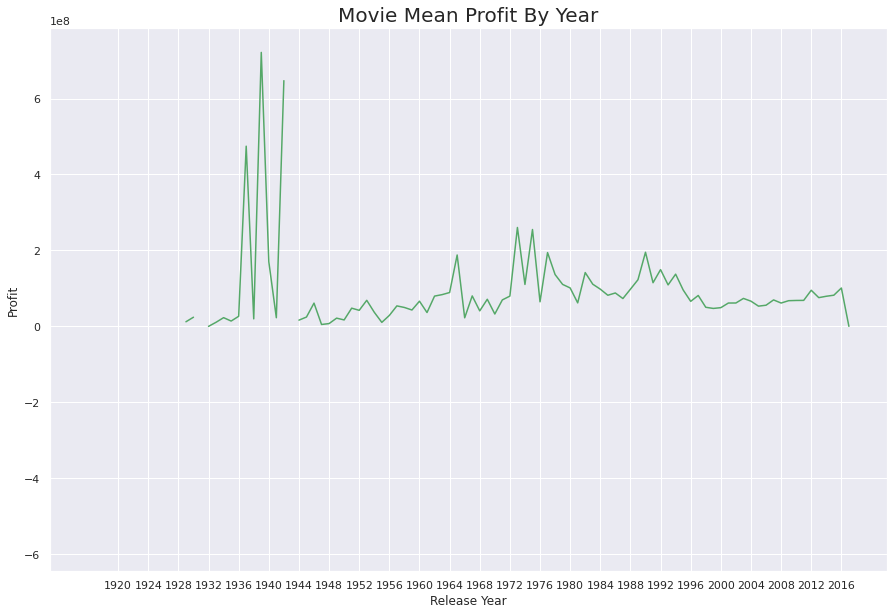

In [ ]:
# revenue by year 

df_merged_old['meanProfitByYear'] = df_merged_old.groupby("release_year")["profit_adj"].aggregate('mean')
df_merged_old['meanProfitByYear'].plot(figsize=(15,10),color="g")
plt.xticks(np.arange(1920,2020,4))
plt.xlabel("Release Year")
plt.ylabel("Profit")
plt.title("Movie Mean Profit By Year",fontsize=20)
plt.show()


# Copyright Justin Davda (E: justin.davda@stern.nyu.edu)



